# EDA Graph Features

In [0]:
#imports
import matplotlib.pyplot as plt
import time
import numpy as np 
import pandas as pd
import time
import numpy as np 
import pandas as pd
import seaborn as sns
from pytz import timezone 
from datetime import  datetime, timedelta
from pyspark.sql.functions import col,  when, concat, lit

from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler, PCA
from pyspark.ml import Pipeline

In [0]:
from pyspark.sql.functions import col, max

blob_container = "blobcontainer" # The name of your container created in https://portal.azure.com
storage_account = "w261section05group03" # The name of your Storage account created in https://portal.azure.com
secret_scope = "w261section05group04" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "houseofthedragon" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

In [0]:
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

In [0]:
# Inspect the Mount's Final Project folder 
# Please IGNORE dbutils.fs.cp("/mnt/mids-w261/datasets_final_project/stations_data/", "/mnt/mids-w261/datasets_final_project_2022/stations_data/", recurse=True)
data_BASE_DIR = "dbfs:/mnt/mids-w261/datasets_final_project_2022/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data/,parquet_airlines_data/,0,1656618287000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_1y/,parquet_airlines_data_1y/,0,1656630272000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0,1656630114000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0,1656630205000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data/,parquet_weather_data/,0,1656622074000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_1y/,parquet_weather_data_1y/,0,1656631614000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_3m/,parquet_weather_data_3m/,0,1656630651000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_6m/,parquet_weather_data_6m/,0,1656631047000
dbfs:/mnt/mids-w261/datasets_final_project_2022/stations_data/,stations_data/,0,1656713663000


In [0]:
df_airportcodes = spark.table("hive_metastore.default.airports_t_20")
df_runways = spark.table("hive_metastore.default.runways_t_20")

## Load Flight data

In [0]:
#df_airlines = spark.read.parquet(f"{data_BASE_DIR}parquet_airlines_data_1y/")
df_airlines = spark.read.parquet(f"{blob_url}/df_airlines_silver")
df_airlines.cache().count()

Out[7]: 41451869

In [0]:
display(df_airlines)

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,YEAR,ident,type,name,elevation_ft,continent,iso_country,iso_region,municipality,gps_code,iata_code,local_code,coordinates,tz,FLIGHT_TIMESTAMP,calc_dep_delay,calc_arr_delay
2,5,18,6,2019-05-18,UA,19977,N15710,11057,CLT,NC,11618,EWR,NJ,710,710,0.0,0.0,0.0,0,0700-0759,859,900,1.0,1.0,0.0,0,0800-0859,0.0,0.0,529.0,3,0.0,0.0,0.0,0.0,0.0,2019,KCLT,large_airport,Charlotte Douglas International Airport,748,NA,US,US-NC,Charlotte,KCLT,CLT,CLT,"-80.94309997558594, 35.2140007019043",America/New_York,2019-05-18T11:10:00.000+0000,0,-41
4,10,20,6,2018-10-20,B6,20409,N284JB,12478,JFK,NY,14576,ROC,NY,820,814,-6.0,0.0,0.0,-1,0800-0859,941,927,-14.0,0.0,0.0,-1,0900-0959,0.0,0.0,264.0,2,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-20T12:20:00.000+0000,6,14
2,5,18,6,2019-05-18,UA,19977,N37471,12266,IAH,TX,13198,MCI,MO,2005,2004,-1.0,0.0,0.0,-1,2000-2059,2203,2256,53.0,53.0,1.0,3,2200-2259,0.0,0.0,643.0,3,0.0,0.0,53.0,0.0,0.0,2019,KIAH,large_airport,George Bush Intercontinental Houston Airport,97,NA,US,US-TX,Houston,KIAH,IAH,IAH,"-95.34140014648438, 29.984399795532227",America/Chicago,2019-05-19T01:05:00.000+0000,1,-53
4,10,30,2,2018-10-30,B6,20409,N506JB,14843,SJU,PR,10529,BDL,CT,1233,1230,-3.0,0.0,0.0,-1,1200-1259,1634,1623,-11.0,0.0,0.0,-1,1600-1659,0.0,0.0,1666.0,7,0.0,0.0,0.0,0.0,0.0,2018,TJSJ,large_airport,Luis Munoz Marin International Airport,9,NA,PR,PR-U-A,San Juan,TJSJ,SJU,SJU,"-66.0018005371, 18.4393997192",America/Puerto_Rico,2018-10-30T16:33:00.000+0000,3,11
2,6,6,4,2019-06-06,YX,20452,N357FC,11433,DTW,MI,12945,LEX,KY,1217,1215,-2.0,0.0,0.0,-1,1200-1259,1331,1322,-9.0,0.0,0.0,-1,1300-1359,0.0,0.0,296.0,2,0.0,0.0,0.0,0.0,0.0,2019,KDTW,large_airport,Detroit Metropolitan Wayne County Airport,645,NA,US,US-MI,Detroit,KDTW,DTW,DTW,"-83.35340118408203, 42.212398529052734",America/New_York,2019-06-06T16:17:00.000+0000,2,9
4,10,30,2,2018-10-30,B6,20409,N606JB,12478,JFK,NY,12191,HOU,TX,1420,1412,-8.0,0.0,0.0,-1,1400-1459,1724,1649,-35.0,0.0,0.0,-2,1700-1759,0.0,0.0,1428.0,6,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-30T18:20:00.000+0000,8,75
2,6,6,4,2019-06-06,YX,20452,N870RW,12953,LGA,NY,10792,BUF,NY,2155,2154,-1.0,0.0,0.0,-1,2100-2159,2323,2328,5.0,5.0,0.0,0,2300-2359,0.0,0.0,292.0,2,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T01:55:00.000+0000,1,-5
4,10,30,2,2018-10-30,B6,20409,N775JB,12954,LGB,CA,14831,SJC,CA,650,640,-10.0,0.0,0.0,-1,0600-0659,810,807,-3.0,0.0,0.0,-1,0800-0859,0.0,0.0,324.0,2,0.0,0.0,0.0,0.0,0.0,2018,KLGB,medium_airport,Long Beach /Daugherty Field/ Airport,60,NA,US,US-CA,Long Beach,KLGB,LGB,LGB,"-118.1520004, 33.81769943",America/Los_Angeles,2018-10-30T13:50:00.000+0000,10,3
2,6,7,5,2019-06-07,YX,20452,N205JQ,12953,LGA,NY,11057,CLT,NC,630,629,-1.0,0.0,0.0,-1,0600-0659,837,832,-5.0,0.0,0.0,-1,0800-0859,0.0,0.0,544.0,3,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T10:30:00.000+0000,1,5
4,10,31,3,2018-10-31,B6,20409,N594JB,12954,LGB,CA,12478,JFK,NY,2050,2047,-3.0,0.0,0.0,-1,2000-2059,459,449,-10.0,0.0,0.0,-1,0001-0559,0.0,0.0,2465.0,10,0.0,0.0,0.0,0.0,0.0,2018,KLGB,medium_airport,Long Beach /Daugherty Field/ Airport,60,NA,US,US-C

In [0]:
## Add column for city pair
df_airlines = df_airlines.withColumn("CITY_PAIR", concat(col("ORIGIN"),lit('-'),col("DEST")) )

display(df_airlines)

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,YEAR,ident,type,name,elevation_ft,continent,iso_country,iso_region,municipality,gps_code,iata_code,local_code,coordinates,tz,FLIGHT_TIMESTAMP,calc_dep_delay,calc_arr_delay,CITY_PAIR
2,5,18,6,2019-05-18,UA,19977,N15710,11057,CLT,NC,11618,EWR,NJ,710,710,0.0,0.0,0.0,0,0700-0759,859,900,1.0,1.0,0.0,0,0800-0859,0.0,0.0,529.0,3,0.0,0.0,0.0,0.0,0.0,2019,KCLT,large_airport,Charlotte Douglas International Airport,748,NA,US,US-NC,Charlotte,KCLT,CLT,CLT,"-80.94309997558594, 35.2140007019043",America/New_York,2019-05-18T11:10:00.000+0000,0,-41,CLT-EWR
4,10,20,6,2018-10-20,B6,20409,N284JB,12478,JFK,NY,14576,ROC,NY,820,814,-6.0,0.0,0.0,-1,0800-0859,941,927,-14.0,0.0,0.0,-1,0900-0959,0.0,0.0,264.0,2,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-20T12:20:00.000+0000,6,14,JFK-ROC
2,5,18,6,2019-05-18,UA,19977,N37471,12266,IAH,TX,13198,MCI,MO,2005,2004,-1.0,0.0,0.0,-1,2000-2059,2203,2256,53.0,53.0,1.0,3,2200-2259,0.0,0.0,643.0,3,0.0,0.0,53.0,0.0,0.0,2019,KIAH,large_airport,George Bush Intercontinental Houston Airport,97,NA,US,US-TX,Houston,KIAH,IAH,IAH,"-95.34140014648438, 29.984399795532227",America/Chicago,2019-05-19T01:05:00.000+0000,1,-53,IAH-MCI
4,10,30,2,2018-10-30,B6,20409,N506JB,14843,SJU,PR,10529,BDL,CT,1233,1230,-3.0,0.0,0.0,-1,1200-1259,1634,1623,-11.0,0.0,0.0,-1,1600-1659,0.0,0.0,1666.0,7,0.0,0.0,0.0,0.0,0.0,2018,TJSJ,large_airport,Luis Munoz Marin International Airport,9,NA,PR,PR-U-A,San Juan,TJSJ,SJU,SJU,"-66.0018005371, 18.4393997192",America/Puerto_Rico,2018-10-30T16:33:00.000+0000,3,11,SJU-BDL
2,6,6,4,2019-06-06,YX,20452,N357FC,11433,DTW,MI,12945,LEX,KY,1217,1215,-2.0,0.0,0.0,-1,1200-1259,1331,1322,-9.0,0.0,0.0,-1,1300-1359,0.0,0.0,296.0,2,0.0,0.0,0.0,0.0,0.0,2019,KDTW,large_airport,Detroit Metropolitan Wayne County Airport,645,NA,US,US-MI,Detroit,KDTW,DTW,DTW,"-83.35340118408203, 42.212398529052734",America/New_York,2019-06-06T16:17:00.000+0000,2,9,DTW-LEX
4,10,30,2,2018-10-30,B6,20409,N606JB,12478,JFK,NY,12191,HOU,TX,1420,1412,-8.0,0.0,0.0,-1,1400-1459,1724,1649,-35.0,0.0,0.0,-2,1700-1759,0.0,0.0,1428.0,6,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-30T18:20:00.000+0000,8,75,JFK-HOU
2,6,6,4,2019-06-06,YX,20452,N870RW,12953,LGA,NY,10792,BUF,NY,2155,2154,-1.0,0.0,0.0,-1,2100-2159,2323,2328,5.0,5.0,0.0,0,2300-2359,0.0,0.0,292.0,2,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T01:55:00.000+0000,1,-5,LGA-BUF
4,10,30,2,2018-10-30,B6,20409,N775JB,12954,LGB,CA,14831,SJC,CA,650,640,-10.0,0.0,0.0,-1,0600-0659,810,807,-3.0,0.0,0.0,-1,0800-0859,0.0,0.0,324.0,2,0.0,0.0,0.0,0.0,0.0,2018,KLGB,medium_airport,Long Beach /Daugherty Field/ Airport,60,NA,US,US-CA,Long Beach,KLGB,LGB,LGB,"-118.1520004, 33.81769943",America/Los_Angeles,2018-10-30T13:50:00.000+0000,10,3,LGB-SJC
2,6,7,5,2019-06-07,YX,20452,N205JQ,12953,LGA,NY,11057,CLT,NC,630,629,-1.0,0.0,0.0,-1,0600-0659,837,832,-5.0,0.0,0.0,-1,0800-0859,0.0,0.0,544.0,3,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T10:30:00.000+0000,1,5,LGA-CLT
4,10,31,3,2018-10-31,B6,20409,N594JB,12954,LGB,CA,12478,JFK,NY,2050,2047,-3.0,0.0,0.0,-1,2000-2059,459,449,-10.0,0.0,0.0,-1,0001-0559,0.0,0.0,2465.0,10,0.0,0.0,0.0,0

In [0]:
# Calculate group delays by all city pair

citypair_delays = df_airlines.groupBy("CITY_PAIR").sum("DEP_DEL15").toPandas()

#Calcualte delays in minutes
citypair_delays_minutes = df_airlines.groupBy("CITY_PAIR").mean("DEP_DELAY").toPandas()
citypair_delays_count = df_airlines.groupBy("CITY_PAIR").count().toPandas()
citypair_delays.set_index('CITY_PAIR', inplace=True)
citypair_delays_count.set_index('CITY_PAIR', inplace=True)
citypair_delays_minutes.set_index('CITY_PAIR', inplace=True)

#test_delays_count
df_citypairdelays = pd.concat([citypair_delays,citypair_delays_count],axis = 1)
df_citypairdelays = pd.concat([df_citypairdelays,citypair_delays_minutes],axis = 1)

##df_delays.sort_values(by ='% of Total Values', ascending=False )
df_citypairdelays['percentage']=df_citypairdelays['sum(DEP_DEL15)']/df_citypairdelays['count']*100

#df_delays.index = pd.to_datetime(df_delays.index, errors='coerce')
#df_delays.sort_index(inplace=True)
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)
df_citypairdelays = df_citypairdelays.reset_index()

df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)


,CITY_PAIR,sum(DEP_DEL15),count,avg(DEP_DELAY),percentage
7016,SFO-LAX,18762.0,93618,10.538689,20.041018
3190,LAX-SFO,22527.0,92672,13.553544,24.308313
7505,JFK-LAX,11726.0,76123,8.136411,15.404017
2495,LAX-JFK,14881.0,76096,11.643621,19.555561
3898,LAS-LAX,13559.0,71682,9.353994,18.915488
3678,LAX-LAS,14008.0,71656,8.970372,19.548956
3759,LGA-ORD,13344.0,70469,12.801033,18.935986
186,ORD-LGA,16520.0,70018,15.175383,23.593933
5211,OGG-HNL,4811.0,62614,-0.141965,7.683585
870,HNL-OGG,3533.0,62574,-0.690287,5.646115


In [0]:
# aggreate all delays by city pair both Origina and Destination
df_citypairdelays[['ORIGIN','DESTIN']]= df_citypairdelays['CITY_PAIR'].str.split('-', expand=True)
df_citypairdelays['SET_KEY'] = df_citypairdelays[['ORIGIN','DESTIN']].to_numpy().tolist()
df_citypairdelays['SET_KEY'] = df_citypairdelays.SET_KEY.map(set)
df_citypairdelays['SET_KEY'] = df_citypairdelays.SET_KEY.map(list)
df_citypairdelays['SET_KEY']= df_citypairdelays['SET_KEY'].str[0]+ '-'+ df_citypairdelays['SET_KEY'].str[1]
#bring in the 
df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)


,CITY_PAIR,sum(DEP_DEL15),count,avg(DEP_DELAY),percentage,ORIGIN,DESTIN,SET_KEY
7016,SFO-LAX,18762.0,93618,10.538689,20.041018,SFO,LAX,SFO-LAX
3190,LAX-SFO,22527.0,92672,13.553544,24.308313,LAX,SFO,SFO-LAX
7505,JFK-LAX,11726.0,76123,8.136411,15.404017,JFK,LAX,JFK-LAX
2495,LAX-JFK,14881.0,76096,11.643621,19.555561,LAX,JFK,JFK-LAX
3898,LAS-LAX,13559.0,71682,9.353994,18.915488,LAS,LAX,LAS-LAX
3678,LAX-LAS,14008.0,71656,8.970372,19.548956,LAX,LAS,LAS-LAX
3759,LGA-ORD,13344.0,70469,12.801033,18.935986,LGA,ORD,LGA-ORD
186,ORD-LGA,16520.0,70018,15.175383,23.593933,ORD,LGA,LGA-ORD
5211,OGG-HNL,4811.0,62614,-0.141965,7.683585,OGG,HNL,OGG-HNL
870,HNL-OGG,3533.0,62574,-0.690287,5.646115,HNL,OGG,OGG-HNL


In [0]:
# calculate the number of operations by city pair, 
city_pair_operations = df_citypairdelays.groupby(['SET_KEY'])['count'].sum().to_frame(name = 'count').reset_index()
city_pair_operations.rename(columns = {'SET_KEY':'CITY_PAIR'}, inplace = True)
city_pair_operations.sort_values(by = 'count', ascending = False).head(10)

city_pair_operations2 = df_citypairdelays.groupby(['SET_KEY'])['avg(DEP_DELAY)'].mean().to_frame(name = 'avg_min_delay').reset_index()
city_pair_operations2.rename(columns = {'SET_KEY':'CITY_PAIR'}, inplace = True)
#city_pair_operations2.sort_values(by = 'count', ascending = False).head(10)

#city_pair_operations.sort_values(by = 'count', ascending = False).head(10)

city_pair_operations = pd.merge(city_pair_operations, city_pair_operations2, left_on='CITY_PAIR', right_on='CITY_PAIR')
city_pair_operations.sort_values(by = 'count', ascending = False).head(10)


,CITY_PAIR,count,avg_min_delay
3913,SFO-LAX,186290,12.046116
2049,JFK-LAX,152219,9.890016
2179,LAS-LAX,143338,9.162183
2395,LGA-ORD,140487,13.988208
2972,OGG-HNL,125188,-0.416126
2311,LAX-SEA,117399,5.232440
129,ATL-MCO,116436,8.130244
1495,FLL-ATL,107369,8.599010
2341,LGA-ATL,106729,12.508699
3955,SFO-SEA,105843,10.927334


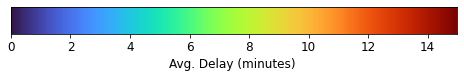

In [0]:
# create color scale bar for legend
from matplotlib.cm import viridis, turbo
from matplotlib.colors import to_hex

# We will need to scale the GINI values to lie between 0 and 1
min_gini = 0
max_gini = 15
gini_range = max_gini - min_gini

def calculate_color(gini):
    """
    Convert the GINI coefficient to a color
    """
    # make gini a number between 0 and 1
    normalized_gini = (gini - min_gini) / gini_range

    # invert gini so that high inequality gives dark color
    inverse_gini = 1.0 - normalized_gini

    # transform the gini coefficient to a matplotlib color
    #mpl_color = viridis(inverse_gini)
    mpl_color = turbo(normalized_gini)
    # transform from a matplotlib color to a valid CSS color
    gmaps_color = to_hex(mpl_color, keep_alpha=False)

    return gmaps_color

n=500
fig, ax = plt.subplots(figsize=(8, 0.5))
plt.rcParams['font.size'] = 12
for x in range(n+1):
    ax.axvline(gini_range*x/n+min_gini, color=calculate_color(gini_range*x/n+min_gini), linewidth=4) 
#ax.set_title("hello")
ax.set_xlabel('Avg. Delay (minutes) ')
#ax.xaxis.set_major_formatter('${x:,.0f}')
ax.set_ylim(0,0.5)
ax.set_xlim(0,15)
ax.get_yaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.show()

In [0]:
# assign a color to every city pair
test3 = city_pair_operations.sort_values(by = 'count', ascending = False).head(20)
col_list = test3["avg_min_delay"].values.tolist()
#print(col_list)

colors = []
for i in col_list:
  colors.append(calculate_color(i))

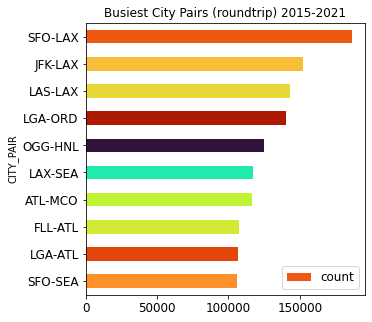

In [0]:

fig, ax = plt.subplots(figsize=(5, 5))

# Plot horizontal bar graph
city_pair_operations.sort_values(by='count', ascending=False).head(10).plot.barh(x='CITY_PAIR',
                      y='count',
                      ax=ax, color=colors
                      )
ax.invert_yaxis()
ax.set_title("Busiest City Pairs (roundtrip) 2015-2021")
ax.title.set_size(12)
ax.xaxis.label.set_size(10)
ax.yaxis.label.set_size(10)
plt.show()

In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split

#get the coordinates of each airport for plotting

test = df_airlines.select(["iata_code", "coordinates" ]).distinct()
airport_codes = test.withColumn("LONGITUDE", split(col("coordinates"), ",").getItem(0)).withColumn("LATITUDE", split(col("coordinates"), ",").getItem(1))
df_airport_codes= airport_codes.toPandas()
df_airport_codes

,iata_code,coordinates,LONGITUDE,LATITUDE
0,IAD,"-77.45580292, 38.94449997",-77.45580292,38.94449997
1,PRC,"-112.419998, 34.654499",-112.419998,34.654499
2,EAU,"-91.48429870605469, 44.86579895019531",-91.48429870605469,44.86579895019531
3,CHA,"-85.20379638671875, 35.035301208496094",-85.20379638671875,35.035301208496094
4,IPT,"-76.92109680175781, 41.241798400878906",-76.92109680175781,41.241798400878906
...,...,...,...,...
381,RIC,"-77.3197021484375, 37.50519943237305",-77.3197021484375,37.50519943237305
382,ABY,"-84.19450378417969, 31.535499572753906",-84.19450378417969,31.535499572753906
383,BIH,"-118.363998413, 37.3731002808",-118.363998413,37.3731002808
384,EFD,"-95.1587982178, 29.607299804700002",-95.1587982178,29.607299804700002


In [0]:
# calculat the average delay in minutes for every city pair
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)
city_pair_operations[['ORIGIN','DESTIN']]= city_pair_operations['CITY_PAIR'].str.split('-', expand=True)
city_pair_operations['SET_KEY'] = city_pair_operations[['ORIGIN','DESTIN']].to_numpy().tolist()
city_pair_operations['SET_KEY'] = city_pair_operations.SET_KEY.map(set)
city_pair_operations['SET_KEY'] = city_pair_operations.SET_KEY.map(list)
city_pair_operations['SET_KEY']= city_pair_operations['SET_KEY'].str[0]+ '-'+ city_pair_operations['SET_KEY'].str[1]
city_pair_operations.sort_values(by = 'count', ascending = False).head(10)

,CITY_PAIR,count,avg_min_delay,ORIGIN,DESTIN,SET_KEY
3913,SFO-LAX,186290,12.046116,SFO,LAX,SFO-LAX
2049,JFK-LAX,152219,9.890016,JFK,LAX,JFK-LAX
2179,LAS-LAX,143338,9.162183,LAS,LAX,LAS-LAX
2395,LGA-ORD,140487,13.988208,LGA,ORD,LGA-ORD
2972,OGG-HNL,125188,-0.416126,OGG,HNL,OGG-HNL
2311,LAX-SEA,117399,5.232440,LAX,SEA,LAX-SEA
129,ATL-MCO,116436,8.130244,ATL,MCO,ATL-MCO
1495,FLL-ATL,107369,8.599010,FLL,ATL,FLL-ATL
2341,LGA-ATL,106729,12.508699,LGA,ATL,LGA-ATL
3955,SFO-SEA,105843,10.927334,SFO,SEA,SFO-SEA


In [0]:
# JOin to bring the coordinate origin and destination for tracing
test = pd.merge(city_pair_operations, df_airport_codes, left_on='ORIGIN', right_on='iata_code')
test.rename(columns = {'LONGITUDE':'LONGITUDE_ORIGIN', 'LATITUDE':'LATITUDE_ORIGIN'}, inplace = True)
test = pd.merge(test, df_airport_codes, left_on='DESTIN', right_on='iata_code')
test.rename(columns = {'LONGITUDE':'LONGITUDE_DESTIN', 'LATITUDE':'LATITUDE_DESTIN'}, inplace = True)
test = test.sort_values(by = 'count', ascending = False).head(100)
test

,CITY_PAIR,count,avg_min_delay,ORIGIN,DESTIN,SET_KEY,iata_code_x,coordinates_x,LONGITUDE_ORIGIN,LATITUDE_ORIGIN,iata_code_y,coordinates_y,LONGITUDE_DESTIN,LATITUDE_DESTIN
1166,SFO-LAX,186290,12.046116,SFO,LAX,SFO-LAX,SFO,"-122.375, 37.61899948120117",-122.375,37.61899948120117,LAX,"-118.407997, 33.942501",-118.407997,33.942501
1140,JFK-LAX,152219,9.890016,JFK,LAX,JFK-LAX,JFK,"-73.7789, 40.639801",-73.7789,40.639801,LAX,"-118.407997, 33.942501",-118.407997,33.942501
1142,LAS-LAX,143338,9.162183,LAS,LAX,LAS-LAX,LAS,"-115.1520004, 36.08010101",-115.1520004,36.08010101,LAX,"-118.407997, 33.942501",-118.407997,33.942501
1440,LGA-ORD,140487,13.988208,LGA,ORD,LGA-ORD,LGA,"-73.872597, 40.777199",-73.872597,40.777199,ORD,"-87.9048, 41.9786",-87.9048,41.9786
2414,OGG-HNL,125188,-0.416126,OGG,HNL,OGG-HNL,OGG,"-156.429993, 20.8986",-156.429993,20.8986,HNL,"-157.924228, 21.32062",-157.924228,21.32062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1567,DFW-PHX,58255,9.752546,DFW,PHX,DFW-PHX,DFW,"-97.038002, 32.896801",-97.038002,32.896801,PHX,"-112.01200103759766, 33.43429946899414",-112.01200103759766,33.43429946899414
2213,LGA-DCA,57572,7.680932,LGA,DCA,LGA-DCA,LGA,"-73.872597, 40.777199",-73.872597,40.777199,DCA,"-77.037697, 38.8521",-77.037697,38.8521
1768,SJC-SEA,56914,4.330893,SJC,SEA,SJC-SEA,SJC,"-121.929001, 37.362598",-121.929001,37.362598,SEA,"-122.308998, 47.449001",-122.308998,47.449001
1046,SFO-DFW,56892,13.748635,SFO,DFW,SFO-DFW,SFO,"-122.375, 37.61899948120117",-122.375,37.61899948120117,DFW,"-97.038002, 32.896801",-97.038002,32.896801


In [0]:
# get list of cities for plotting
def unique_airports(lst1, lst2):
    final_list = list(set(lst1) | set(lst2))
    return final_list
  
  
list_cities = unique_airports(test.drop_duplicates('DESTIN')['DESTIN'], test.drop_duplicates('ORIGIN')['ORIGIN'])
df_list_cities = pd.DataFrame (list_cities, columns = ['cities'])
df_list_cities = pd.merge(df_list_cities, df_airport_codes, left_on='cities', right_on='iata_code')
df_list_cities

,cities,iata_code,coordinates,LONGITUDE,LATITUDE
0,TPA,TPA,"-82.533203125, 27.975500106811523",-82.533203125,27.975500106811523
1,JFK,JFK,"-73.7789, 40.639801",-73.7789,40.639801
2,HOU,HOU,"-95.27890015, 29.64539909",-95.27890015,29.64539909
3,JAX,JAX,"-81.68789672851562, 30.49410057067871",-81.68789672851562,30.49410057067871
4,DAL,DAL,"-96.851799, 32.847099",-96.851799,32.847099
5,SLC,SLC,"-111.97799682617188, 40.78839874267578",-111.97799682617188,40.78839874267578
6,EWR,EWR,"-74.168701171875, 40.692501068115234",-74.168701171875,40.692501068115234
7,SEA,SEA,"-122.308998, 47.449001",-122.308998,47.449001
8,DEN,DEN,"-104.672996521, 39.861698150635",-104.672996521,39.861698150635
9,MIA,MIA,"-80.29060363769531, 25.79319953918457",-80.29060363769531,25.79319953918457


In [0]:
#Make PLot with average delays per city pair
import matplotlib.pyplot as plt
import plotly.graph_objects as go
## Loop thorugh each flight 
fig = go.Figure()

source_to_dest = zip(test["LATITUDE_ORIGIN"], test["LATITUDE_DESTIN"],
                     test["LONGITUDE_ORIGIN"], test["LONGITUDE_DESTIN"],
                     test["avg_min_delay"])
for slat,dlat, slon, dlon, num_flights in source_to_dest:
    fig.add_trace(go.Scattergeo(
                        lat = [slat,dlat],
                        lon = [slon, dlon],
                        mode = 'lines',
                        line = dict(width = 1.5, color=calculate_color(num_flights))
                        ))

## Logic to create labels of source and destination cities of flights
cities = test["ORIGIN"].values.tolist()+test["DESTIN"].values.tolist()
scatter_hover_data = [city for city in cities]

## Loop thorugh each flight entry to plot source and destination as points.
fig.add_trace(
    go.Scattergeo(
                lon = df_list_cities["LONGITUDE"],
                lat = df_list_cities["LATITUDE"],
                text = df_list_cities['cities'],
                mode = 'markers+text',
                marker = dict(size = 10, color = 'blue', opacity=0.1))
    )    
    

fig.update_layout(title = ' 100 Busiest US Airports and average departure delays 2015-2021',
                  height=700, width=900, geo_scope='usa',
                  #margin={"t":0,"b":0,"l":0, "r":0, "pad":0},
                  #geo = dict(projection_type = 'natural earth',scope = 'north america'),
                  showlegend=False, autosize=True)

fig.show()


##Page Rank

In [0]:
# Functions from HW 5

def initGraph(dataRDD):
    """
    Spark job to read in the raw data and initialize an 
    adjacency list representation with a record for each
    node (including dangling nodes).
    
    Returns: 
        graphRDD -  a pair RDD of (node_id , (score, edges))
        
    NOTE: The score should be a float, but you may want to be 
    strategic about how format the edges... there are a few 
    options that can work. Make sure that whatever you choose
    is sufficient for Question 8 where you'll run PageRank.
    """
    ############## YOUR CODE HERE ###############

    # write any helper functions here
    #def parse(line):
    #    node, edges = line.split('\t')
    #    return (node, ast.literal_eval(edges))
    
    # parse the contents of the RDD and cache 
    #inputRDD = dataRDD.map(lambda line: parse(line)).cache()
    
    #all nodes with inlinks are from the keys of hte dictionaries
    #none of these operations are very scalable!
    nodes_inlinks = dataRDD.flatMap(lambda x: list(x[1].keys())).distinct().collect()
    connected_nodes = dataRDD.map(lambda x: (x[0])).collect()
  
    # the nodes dangling = difference between the combination
    # of these two sets and the connected nodes
    
    all_nodes = set(connected_nodes).union(nodes_inlinks)
    nodes_dangling = all_nodes - set(connected_nodes)
    
    #initializin weight
    N = len(all_nodes)
    
    dangle_nodesRDD = sc.parallelize(nodes_dangling).map(lambda x: (x, (float(1/N),{}))) # deal with danling nodes
    
    nondangled_nodesRDD = dataRDD.map(lambda x: (x[0],(float(1/N), {key: value for key, value in x[1].items()})))
    
    #put togheter both dangled and non dangling nodes in single RDD.
    graphRDD = dangle_nodesRDD.union(nondangled_nodesRDD)
    
    ############## (END) YOUR CODE ##############
    
    return graphRDD
  

def merge_dic(x, y):
  x.update(y)
  return x

In [0]:
# part d - provided FloatAccumulator class (RUN THIS CELL AS IS)

from pyspark.accumulators import AccumulatorParam

class FloatAccumulatorParam(AccumulatorParam):
    """
    Custom accumulator for use in page rank to keep track of various masses.
    
    IMPORTANT: accumulators should only be called inside actions to avoid duplication.
    We stringly recommend you use the 'foreach' action in your implementation below.
    """
    def zero(self, value):
        return value
    def addInPlace(self, val1, val2):
        return val1 + val2

In [0]:
# part d - job to run PageRank (RUN THIS CELL AS IS)
def runPageRank(graphInitRDD, alpha = 0.15, maxIter = 10, verbose = True):
    """
    Spark job to implement page rank
    Args: 
        graphInitRDD  - pair RDD of (node_id , (score, edges))
        alpha         - (float) teleportation factor
        maxIter       - (int) stopping criteria (number of iterations)
        verbose       - (bool) option to print logging info after each iteration
    Returns:
        steadyStateRDD - pair RDD of (node_id, pageRank)
    """
    # teleportation:
    a = sc.broadcast(alpha)
    
    # damping factor:
    d = sc.broadcast(1-a.value)
    
    # initialize accumulators for dangling mass & total mass
    mmAccum = sc.accumulator(0.0, FloatAccumulatorParam())
    totAccum = sc.accumulator(0.0, FloatAccumulatorParam())
    
    ############## YOUR CODE HERE ###############
        # write your helper functions here, 
    # please document the purpose of each clearly 
    # for reference, the master solution has 5 helper functions.
      # initialization 
    def check_total_accum(line):
        """debugging information for verbose option
        keeps track of the sum of mass"""
        totAccum.add(line[1][0])

    def combine_node_weights(x,y):
        """merges the dictionary keys for a node with the passed on mass"""
        passed_on_mass = x[0] + y[0]
        edges = {**x[1], **y[1]}  # neat python trick 
        return (passed_on_mass, edges)
        
    def normalize_edges(line):
        """split the input tuple and extract the dictionary with nodes and inlinks"""
        #parse components from the input line
        node =  line[0]
        dict_edges =line[1]
        g =line[1][0]
        edges = line[1][1]
        #update the dictionary with the distributed weight across inlinked nodes
        if edges != {}:
            prob  = float(g) / sum(edges.values())
            for vertex, weight in edges.items():
                yield (vertex, (prob * weight, {}))
        yield (node, (0, edges))

    def teleport(line):
        """aplies the teleporting and dampeing factor"""
        node =  line[0]
        dict_edges =line[1]
        g =line[1][0]
        edges = line[1][1]
        teleport_factor = (a.value/G) + (d.value * (hanging_mass/G + g))
        return (node, (teleport_factor, edges))

    def dangling_accum(line):
        """collect mass from dangling nodes"""
        edges = line[1][1]
        if edges == {}:
            mmAccum.add(line[1][0]) # line[1][0] is the weight
    
    G = graphInitRDD.count()
        
    for i in range(maxIter):
        graphInitRDD.foreach(dangling_accum)
        hanging_mass = mmAccum.value
        
        #using reducekey 
        graphInitRDD= graphInitRDD.flatMap(normalize_edges).reduceByKey(combine_node_weights).map(teleport) \
                                  .cache() 
        # QC: keep track of total mass redistributed. # should be virtually 1.0
        graphInitRDD.foreach(check_total_accum)
        
        if verbose: print('step {}|Sum of probability = {}'.format(i, totAccum.value))
        
        mmAccum.value = 0.0
        totAccum.value = 0.0  
        steadyStateRDD = graphInitRDD.map(lambda x: (x[0], x[1][0]))
    ############## (END) YOUR CODE ###############
    
    return steadyStateRDD

In [0]:
#Calculate page Rank in time
# extract min and max dates
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month

df = df_airlines
df_byquarter = []

for x in range(2015, 2022): # range of years
  for i in range(4):
    filtered_df = df.filter((year(df.FLIGHT_TIMESTAMP) == x) & (month(df.FLIGHT_TIMESTAMP) >= (3*i+1)) & (month(df.FLIGHT_TIMESTAMP) <= (3*i+3)))
    df_byquarter.append(filtered_df)

rdd_list = []


# convertion to rdd and adjancy list for Page Rank function
for quarter in df_byquarter:
  test = quarter.groupBy('ORIGIN', 'DEST').count()
  testRDD= test.rdd.map(lambda row: (row[0],{row[1]: row[2]}))\
                   .reduceByKey(merge_dic).cache()
  rdd_list.append(testRDD)

  

In [0]:
# save the results in a list for every quarters PageRank
result_pagerank = []
  
for rdd in rdd_list:
  result = runPageRank(initGraph(rdd), alpha=0.01, maxIter=20, verbose = False)
  result = result.toDF(['node','PageRank'])
  result_pagerank.append(result)

In [0]:
#results[0].agg(max('PageRank')).collect()[0][0]
results[0].orderBy('PageRank', ascending=False).select('node').toPandas().node.to_list()
# take top 10
airport_set = results[26].orderBy('PageRank', ascending=False).select('node').toPandas().node.to_list()[0:10]
airport_set

Out[49]: ['ATL', 'DFW', 'DEN', 'ORD', 'CLT', 'LAX', 'SEA', 'PHX', 'LAS', 'IAH']

In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month
#what are teh dates for each quater
quarter_list = []
city_list= []
for x in range(2015, 2022):
  for i in range(4):
    quarter_list.append(f"{i+1}-{x}")


for i in range(len(quarter_list)): 
  results[i] = results[i].withColumn("quarter", lit(quarter_list[i]) )
  city_list = city_list + results[i].select('node').distinct().toPandas().node.to_list()
  
  #maxRank = results[0].agg(max('PageRank')).collect()[0][0]
  #normalized_ranks = cur_month_ranks.withColumn('normalized_rank', F.col('pagerank')/maxRank)
  

In [0]:
city_set = set(city_list)
len(city_set)

Out[52]: 387

In [0]:
# pivot for plotting and exporting
df_pagerank = results[0].toPandas()
df_pagerank = df_pagerank.set_index('node').T.reset_index(drop=True)
df_pagerank.drop(df_pagerank.tail(1).index,inplace=True) # drop last n rows
df_pagerank.rename(index={0:quarter_list[0]},inplace=True)

for i in range(1, len(quarter_list)):
  test1 = results[i].toPandas()
  test1 = test1.set_index('node').T.reset_index(drop=True)
  test1.drop(test1.tail(1).index,inplace=True) # drop last n rows
  test1.rename(index={0:quarter_list[i]},inplace=True)
  
  df_pagerank = pd.concat([df_pagerank, test1],axis = 0)

# df_pagerank.drop(df_pagerank.tail(1).index,inplace=True) # drop last n rows
df_pagerank



node,MYR,OTZ,HLN,BIS,SPS,MDW,FAT,CDV,ISN,INL,...,ALS,JST,ALW,YKM,FOD,PUW,EAT,MCW,BIH,TBN
1-2015,0.00074,0.000183,0.000271,0.000665,0.000252,0.013886,0.001423,0.00023,0.000571,0.000165,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2-2015,0.001144,0.000175,0.000315,0.000664,0.000261,0.01512,0.001327,0.000206,0.000513,0.000158,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3-2015,0.001161,0.000167,0.000319,0.000706,0.000268,0.015524,0.001352,0.000204,0.000469,0.000161,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4-2015,0.00076,0.000174,0.00031,0.000687,0.000236,0.01462,0.001268,0.000218,0.00046,0.000163,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1-2016,0.000756,0.000188,0.000322,0.000481,0.000097,0.014541,0.001298,0.000232,0.000397,0.000171,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2-2016,0.001293,0.000179,0.000335,0.000509,0.000197,0.015635,0.001504,0.000213,0.000335,0.000163,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3-2016,0.001346,0.000175,0.000339,0.00045,0.00021,0.015641,0.001565,0.000206,0.000331,0.000166,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4-2016,0.000817,0.000185,0.000336,0.000366,0.000207,0.015155,0.001612,0.000226,0.000226,0.000165,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1-2017,0.000818,0.000183,0.000308,0.000282,0.000228,0.014255,0.001464,0.000221,0.00018,0.000156,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2-2017,0.00134,0.000178,0.000332,0.000447,0.000038,0.01529,0.001474,0.000215,0.000216,0.000141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


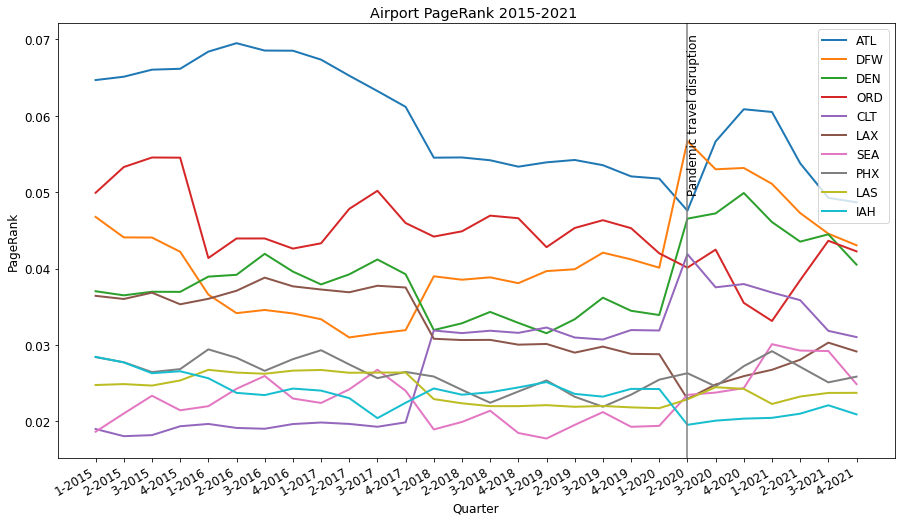

In [0]:
import matplotlib.dates as mdates
import datetime as dt
fig, ax = plt.subplots()

#airport_set = ['DFW', 'ATL']
for airport in airport_set:
    ax.plot(        df_pagerank[airport],
        label = airport,
        linewidth = 2
    )

plt.axvline(x = '2-2020', color = 'gray')

ax.annotate("Pandemic travel disruption", xy = ('2-2020' , 0.06),
             xytext = ('2-2020' , 0.05),
              rotation = 90)
ax.legend()  
fig.set_size_inches(15,8)
plt.xlabel("Quarter")
plt.ylabel("PageRank")
plt.setp(ax.get_xticklabels(), rotation=30, ha="right")
plt.title("Airport PageRank 2015-2021 ")
#ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
##ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
#plt.setp(plt.legend(loc='lower left', prop={'size': 14}, bbox_to_anchor=(0,1.02,1,0.2)).get_lines(), linewidth=6)    
plt.show()

In [0]:
#Only run this to export to blog all the page ranks. otherwiste DO NOT RUN
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName(
  "pandas to spark").getOrCreate()

#export Page Rank to blob for joining
df_pagerank = results[0].toPandas()
df_pagerank['quarter_index'] = 1
df_pagerank['quarter_index_ahead'] = 0
df_pagerank['key'] = df_pagerank['quarter_index'].astype(str) +'-' + df_pagerank['node']
df_pagerank['key_ahead'] = df_pagerank['quarter_index_ahead'].astype(str) +'-' + df_pagerank['node']
for i in range(1, len(quarter_list)):
  test1 = results[i].toPandas()
  test1['quarter_index'] = i+1
  test1['quarter_index_ahead'] = i
  test1['key'] = test1['quarter_index'].astype(str) +'-' + test1['node']
  test1['key_ahead'] = test1['quarter_index_ahead'].astype(str) +'-' + test1['node']
  df_pagerank = pd.concat([df_pagerank, test1],axis = 0)

# df_pagerank.drop(df_pagerank.tail(1).index,inplace=True) # drop last n rows

# assign the pagerank of the next quarters

df_pagerank_assigned = df_pagerank.copy()

df_pagerank_assigned = pd.merge(df_pagerank_assigned, df_pagerank, left_on='key_ahead', right_on='key')


#df_pagerank.drop(index=df_pagerank.index[0], axis=0, inplace=True)

drop_columns = ['quarter_index_x',
       'quarter_index_ahead_x', 'key_x', 'key_ahead_x', 'node_y', 
       'quarter_index_y', 'quarter_index_ahead_y', 'key_y',
       'key_ahead_y', 'quarter_y']

df_pagerank_assigned= df_pagerank_assigned.drop(drop_columns, axis =1)

df_pagerank_assigned.rename(columns = {'node_x':'node', 'PageRank_x':'PageRank',
                              'quarter_x':'quarter', 'PageRank_y':'PageRank_use'}, inplace = True)

df_pagerank_assigned

drop_columns = ['quarter_index',
       'quarter_index_ahead', 'key', 'key_ahead']

df_pagerank = df_pagerank.drop(drop_columns, axis =1)

df_pagerank['PageRank_use'] = df_pagerank['PageRank']
#drop all rows after 1-2015
df_pagerank = df_pagerank[df_pagerank['quarter']=="1-2015"]

# now concaatenate
df_pagerank = pd.concat([df_pagerank, df_pagerank_assigned],axis = 0)


df_pagerank[df_pagerank['node']=="ATL"]
#drop_columns = ['node_x', 'PageRank_x', 'quarter_x', 'quarter_index_x',
#       'quarter_index_ahead_x', 'key_x', 'key_ahead_x', 'node_y', 'PageRank_y',
#       'quarter_y', 'quarter_index_y', 'quarter_index_ahead_y', 'key_y',
#       'key_ahead_y']


df_pagerank['key'] = df_pagerank['quarter'].astype(str) +'-' + df_pagerank['node']

df_pagerank_spark = spark.createDataFrame(df_pagerank)

#write to blob
df_pagerank_spark.write.mode("overwrite").parquet(f"{blob_url}/df_PageRank")

display(df_pagerank_spark)

node,PageRank,quarter,PageRank_use,key
OAK,0.0075490843101547285,1-2015,0.0075490843101547285,1-2015-OAK
GTF,3.3632461743724493E-4,1-2015,3.3632461743724493E-4,1-2015-GTF
OMA,0.003249598238202563,1-2015,0.003249598238202563,1-2015-OMA
CPR,4.000177334482531E-4,1-2015,4.000177334482531E-4,1-2015-CPR
IDA,4.088728623781027E-4,1-2015,4.088728623781027E-4,1-2015-IDA
TWF,1.5463387521728072E-4,1-2015,1.5463387521728072E-4,1-2015-TWF
PHL,0.011683310546383968,1-2015,0.011683310546383968,1-2015-PHL
BIL,5.247629355015766E-4,1-2015,5.247629355015766E-4,1-2015-BIL
ONT,0.003283975964711562,1-2015,0.003283975964711562,1-2015-ONT
DFW,0.04676569196020515,1-2015,0.04676569196020515,1-2015-DFW


## Delay States

In [0]:
display(df_airlines)

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,YEAR,ident,type,name,elevation_ft,continent,iso_country,iso_region,municipality,gps_code,iata_code,local_code,coordinates,tz,FLIGHT_TIMESTAMP,calc_dep_delay,calc_arr_delay,CITY_PAIR
2,5,18,6,2019-05-18,UA,19977,N15710,11057,CLT,NC,11618,EWR,NJ,710,710,0.0,0.0,0.0,0,0700-0759,859,900,1.0,1.0,0.0,0,0800-0859,0.0,0.0,529.0,3,0.0,0.0,0.0,0.0,0.0,2019,KCLT,large_airport,Charlotte Douglas International Airport,748,NA,US,US-NC,Charlotte,KCLT,CLT,CLT,"-80.94309997558594, 35.2140007019043",America/New_York,2019-05-18T11:10:00.000+0000,0,-41,CLT-EWR
4,10,20,6,2018-10-20,B6,20409,N284JB,12478,JFK,NY,14576,ROC,NY,820,814,-6.0,0.0,0.0,-1,0800-0859,941,927,-14.0,0.0,0.0,-1,0900-0959,0.0,0.0,264.0,2,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-20T12:20:00.000+0000,6,14,JFK-ROC
2,5,18,6,2019-05-18,UA,19977,N37471,12266,IAH,TX,13198,MCI,MO,2005,2004,-1.0,0.0,0.0,-1,2000-2059,2203,2256,53.0,53.0,1.0,3,2200-2259,0.0,0.0,643.0,3,0.0,0.0,53.0,0.0,0.0,2019,KIAH,large_airport,George Bush Intercontinental Houston Airport,97,NA,US,US-TX,Houston,KIAH,IAH,IAH,"-95.34140014648438, 29.984399795532227",America/Chicago,2019-05-19T01:05:00.000+0000,1,-53,IAH-MCI
4,10,30,2,2018-10-30,B6,20409,N506JB,14843,SJU,PR,10529,BDL,CT,1233,1230,-3.0,0.0,0.0,-1,1200-1259,1634,1623,-11.0,0.0,0.0,-1,1600-1659,0.0,0.0,1666.0,7,0.0,0.0,0.0,0.0,0.0,2018,TJSJ,large_airport,Luis Munoz Marin International Airport,9,NA,PR,PR-U-A,San Juan,TJSJ,SJU,SJU,"-66.0018005371, 18.4393997192",America/Puerto_Rico,2018-10-30T16:33:00.000+0000,3,11,SJU-BDL
2,6,6,4,2019-06-06,YX,20452,N357FC,11433,DTW,MI,12945,LEX,KY,1217,1215,-2.0,0.0,0.0,-1,1200-1259,1331,1322,-9.0,0.0,0.0,-1,1300-1359,0.0,0.0,296.0,2,0.0,0.0,0.0,0.0,0.0,2019,KDTW,large_airport,Detroit Metropolitan Wayne County Airport,645,NA,US,US-MI,Detroit,KDTW,DTW,DTW,"-83.35340118408203, 42.212398529052734",America/New_York,2019-06-06T16:17:00.000+0000,2,9,DTW-LEX
4,10,30,2,2018-10-30,B6,20409,N606JB,12478,JFK,NY,12191,HOU,TX,1420,1412,-8.0,0.0,0.0,-1,1400-1459,1724,1649,-35.0,0.0,0.0,-2,1700-1759,0.0,0.0,1428.0,6,0.0,0.0,0.0,0.0,0.0,2018,KJFK,large_airport,John F Kennedy International Airport,13,NA,US,US-NY,New York,KJFK,JFK,JFK,"-73.7789, 40.639801",America/New_York,2018-10-30T18:20:00.000+0000,8,75,JFK-HOU
2,6,6,4,2019-06-06,YX,20452,N870RW,12953,LGA,NY,10792,BUF,NY,2155,2154,-1.0,0.0,0.0,-1,2100-2159,2323,2328,5.0,5.0,0.0,0,2300-2359,0.0,0.0,292.0,2,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T01:55:00.000+0000,1,-5,LGA-BUF
4,10,30,2,2018-10-30,B6,20409,N775JB,12954,LGB,CA,14831,SJC,CA,650,640,-10.0,0.0,0.0,-1,0600-0659,810,807,-3.0,0.0,0.0,-1,0800-0859,0.0,0.0,324.0,2,0.0,0.0,0.0,0.0,0.0,2018,KLGB,medium_airport,Long Beach /Daugherty Field/ Airport,60,NA,US,US-CA,Long Beach,KLGB,LGB,LGB,"-118.1520004, 33.81769943",America/Los_Angeles,2018-10-30T13:50:00.000+0000,10,3,LGB-SJC
2,6,7,5,2019-06-07,YX,20452,N205JQ,12953,LGA,NY,11057,CLT,NC,630,629,-1.0,0.0,0.0,-1,0600-0659,837,832,-5.0,0.0,0.0,-1,0800-0859,0.0,0.0,544.0,3,0.0,0.0,0.0,0.0,0.0,2019,KLGA,large_airport,La Guardia Airport,21,NA,US,US-NY,New York,KLGA,LGA,LGA,"-73.872597, 40.777199",America/New_York,2019-06-07T10:30:00.000+0000,1,5,LGA-CLT
4,10,31,3,2018-10-31,B6,20409,N594JB,12954,LGB,CA,12478,JFK,NY,2050,2047,-3.0,0.0,0.0,-1,2000-2059,459,449,-10.0,0.0,0.0,-1,0001-0559,0.0,0.0,2465.0,10,0.0,0.0,0.0,0

In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc, sum

#calculate the average number of flights epr day per city pair
#following the priginal paper, we should use city pairs with morethan 10 flighs per day

#create truncated hour time stamp
df_day = df_airlines.withColumn('day_utc', date_trunc('day', df_airlines.FLIGHT_TIMESTAMP))

# group by  total number of flights btn cities
# per day and calculate the average no. of flights per day

pair_daily = df_day.groupBy('day_utc', 'CITY_PAIR').count() #--ƒagg

pair_daily = pair_daily.withColumnRenamed("count", "total_flights")

#number of days in the dataset
n_days = pair_daily.select('day_utc').distinct().count()

#number of flights per day per ciuty payr

pair_daily_sum = pair_daily.groupBy('CITY_PAIR').sum('total_flights')
pair_daily_sum = pair_daily_sum.withColumnRenamed("sum(total_flights)", "sum")

#only use city pairs with more than 10 flights between them
pair_use = pair_daily_sum.withColumn('daily_avg', pair_daily_sum.sum / n_days).filter(col('daily_avg') >= 10)

display(pair_use)

CITY_PAIR,sum,daily_avg
AUS-DFW,26614,10.400156311059007
DFW-PHX,29149,11.390777647518561
HNL-LIH,42960,16.787807737397422
ITO-HNL,33856,13.230168034388432
ATL-JAX,34040,13.30207112153185
ORD-LGA,70018,27.36146932395467
ORD-DFW,47077,18.39663931223134
SEA-ANC,46374,18.121922626025793
JFK-MCO,31508,12.312622118014849
LAX-IAH,29855,11.666666666666666


In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc, sum, percentile_approx

df_red = df_airlines[['FLIGHT_TIMESTAMP', 'ORIGIN', 'DEST', 'DEP_DELAY_NEW', 'DEP_DEL15', 'CITY_PAIR']]
df_red = df_red.withColumn('hour_stamp', date_trunc('hour', df_network.FLIGHT_TIMESTAMP))
  
pair_count = df_red.groupBy('hour_stamp', 'CITY_PAIR').count()
pair_median = df_red.groupBy('hour_stamp', 'CITY_PAIR').agg(percentile_approx('DEP_DELAY_NEW', 0.5).alias('pairmedian_delay'))

joined_pair = pair_count.join(pair_median, ['hour_stamp', 'CITY_PAIR']).cache()

In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc, sum, percentile_approx
#display(joined_pair.filter((col('CITY_PAIR')=="SFO-LAX") & (col('hour_stamp')=='2015-01-06T20:00:00.000+0000')))
#display(joined_pair.filter((col('CITY_PAIR')=="SFO-LAX") ).select(max('count')))
#display(joined_pair.filter((col('CITY_PAIR')=="SFO-LAX") & (col('count')>=7)))
#display(joined_pair.select(max('count')))
display(joined_pair)


hour_stamp,CITY_PAIR,count,pairmedian_delay
2015-01-01T11:00:00.000+0000,DTW-BOS,1,0.0
2015-01-01T13:00:00.000+0000,ATL-MSP,1,0.0
2015-01-01T13:00:00.000+0000,MCO-DTW,1,30.0
2015-01-01T13:00:00.000+0000,TWF-SLC,1,0.0
2015-01-01T14:00:00.000+0000,MHT-TPA,1,0.0
2015-01-01T14:00:00.000+0000,PDX-SJC,1,0.0
2015-01-01T14:00:00.000+0000,PHX-IAD,1,40.0
2015-01-01T15:00:00.000+0000,DCA-DFW,1,24.0
2015-01-01T15:00:00.000+0000,DFW-BWI,1,5.0
2015-01-01T15:00:00.000+0000,SDF-TPA,1,0.0


In [0]:
display(df_red.filter((col('CITY_PAIR')=="SFO-LAX") & (col('hour_stamp')=='2016-02-06T04:00:00.000+0000')))

FLIGHT_TIMESTAMP,ORIGIN,DEST,DEP_DELAY_NEW,DEP_DEL15,CITY_PAIR,hour_stamp
2016-02-06T04:00:00.000+0000,SFO,LAX,0.0,0.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:10:00.000+0000,SFO,LAX,0.0,0.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:00:00.000+0000,SFO,LAX,0.0,0.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:35:00.000+0000,SFO,LAX,0.0,0.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:00:00.000+0000,SFO,LAX,71.0,1.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:55:00.000+0000,SFO,LAX,51.0,1.0,SFO-LAX,2016-02-06T04:00:00.000+0000
2016-02-06T04:05:00.000+0000,SFO,LAX,37.0,1.0,SFO-LAX,2016-02-06T04:00:00.000+0000


In [0]:
#filter city pairs and create list of featuyres for Kmeans
city_pairs = list(pair_use.select('CITY_PAIR').toPandas()['CITY_PAIR'])
df_filter = joined_pair.filter(col('CITY_PAIR').isin(city_pairs))
df_pivot = df_filter.groupBy('hour_stamp').pivot('CITY_PAIR').mean('pairmedian_delay').na.fill(0)
features = df_pivot.columns[1:]  

In [0]:
display(df_pivot.select("hour_stamp", "LAX-SFO").orderBy("hour_stamp"))

hour_stamp,LAX-SFO
2015-01-01T07:00:00.000+0000,0.0
2015-01-01T08:00:00.000+0000,0.0
2015-01-01T09:00:00.000+0000,0.0
2015-01-01T10:00:00.000+0000,0.0
2015-01-01T11:00:00.000+0000,0.0
2015-01-01T12:00:00.000+0000,0.0
2015-01-01T13:00:00.000+0000,0.0
2015-01-01T14:00:00.000+0000,0.0
2015-01-01T15:00:00.000+0000,0.0
2015-01-01T16:00:00.000+0000,0.0


In [0]:
#CLuster in 2015 or any year 

df_pivot_train = df_pivot.filter((year(df_pivot.hour_stamp) >= 2015) & (year(df_pivot.hour_stamp) <= 2015))
#i = 3
#x= 2015
#df_pivot_train = df_pivot.filter((year(df_pivot.hour_stamp) == x) & (month(df_pivot.hour_stamp) >= (3*i+1)) & (month(df_pivot.hour_stamp) <= (3*i+3)))
#df_pivot_train = df_pivot.filter((df_pivot.hour_stamp >= '2014-12-31') & (df_pivot.hour_stamp < '2021-01-01' ))
#df_pivot_all = df_pivot.filter((df_pivot.hour_stamp >= '2014-12-31') & (df_pivot.hour_stamp < '2022-01-01'))

assemble = VectorAssembler(inputCols=features, outputCol='delay_red')
assembled_data = assemble.transform(df_pivot_train)
assemble = VectorAssembler(inputCols=features, outputCol='delay_red')
all_data = assemble.transform(df_pivot)

silhouette_score = []
evaluator = ClusteringEvaluator(predictionCol='prediction', featuresCol='delay_red', metricName='silhouette', distanceMeasure='squaredEuclidean')

for i in range(2,10):
  KMeans_test = KMeans(featuresCol='delay_red', k=i, seed=100)
  fitted_model = KMeans_test.fit(assembled_data)
  output = fitted_model.transform(assembled_data)
  score=evaluator.evaluate(output)
  print(f'score for k={i}: {score}')


score for k=2: 0.5797539621890143
score for k=3: 0.4374212054672924
score for k=4: 0.4953830381571417
score for k=5: 0.34019103486360086
score for k=6: 0.38973310700269453
score for k=7: 0.36438571600916003
score for k=8: 0.33478976790236364
score for k=9: 0.2967445291035002


In [0]:
#This code does a full set of years ONLY RUN to write in BLOB. OTHERWISE DO NOT RUN!
from pyspark.ml.feature import VectorAssembler, PCA
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml import Pipeline

all_delays = []

lower_train = ['2014-12-31','2016-03-01','2017-05-01','2018-09-01','2019-11-01']
upper_train = ['2016-01-01','2017-03-01','2018-07-01','2019-09-01','2020-10-01']

lower_test = ['2016-01-01','2017-03-01','2018-07-01','2019-09-01','2020-10-01']
upper_test = ['2016-03-01','2017-05-01','2018-09-01','2019-11-01','2021-01-01']


# make filter for dates in train and test sets
for i in range(0,5):
  df_pivot_train = df_pivot.filter((df_pivot.hour_stamp >= lower_train[i]) &(df_pivot.hour_stamp < upper_train[i]) )
  df_pivot_all = df_pivot.filter((df_pivot.hour_stamp >= lower_train[i]) & (df_pivot.hour_stamp < upper_test[i]))
  
  assemble = VectorAssembler(inputCols=features, outputCol='delay_red')
  assembled_data = assemble.transform(df_pivot_train)
  assemble = VectorAssembler(inputCols=features, outputCol='delay_red')
  all_data = assemble.transform(df_pivot_all)

  model_kmeans = KMeans(featuresCol='delay_red', k=5, seed=100)
  fitted_model = model_kmeans.fit(assembled_data)
  predictions = fitted_model.transform(all_data)
  test = predictions.select('hour_stamp', 'prediction')
#   #test = test.withColumnRenamed('prediction', 'prediction_' + str(i))
#   #write to blob
  test.write.mode("overwrite").parquet(f"{blob_url}/df_delay_" + str(i+1))

In [0]:
## all the code from here down is wrangling for exporting etc.

#generate a time series concate them in a single dataframe
from pyspark.sql.functions import col , add_months, expr

df_states = spark.read.parquet(f"{blob_url}/df_delay_2015")
df_states = df_states.withColumn("hour_stamp", df_states.hour_stamp + expr('INTERVAL 1 YEAR') )

for i in range(2016, 2022):
  temp = spark.read.parquet(f"{blob_url}/df_delay_" + str(i))
  temp = temp.withColumn("hour_stamp", temp.hour_stamp + expr('INTERVAL 1 YEAR') )
  df_states = df_states.union(temp)

                                 
df_states.cache().count()

#display(df_time.filter(year(df_time.hour_stamp)==2016))
display(df_states.filter(year(df_states.hour_stamp)==2016).orderBy("hour_stamp"))

hour_stamp,prediction
2016-01-01T07:00:00.000+0000,0
2016-01-01T08:00:00.000+0000,0
2016-01-01T09:00:00.000+0000,0
2016-01-01T10:00:00.000+0000,0
2016-01-01T11:00:00.000+0000,0
2016-01-01T12:00:00.000+0000,0
2016-01-01T13:00:00.000+0000,0
2016-01-01T14:00:00.000+0000,0
2016-01-01T15:00:00.000+0000,0
2016-01-01T16:00:00.000+0000,0


In [0]:
#export fixed 
df_states = spark.read.parquet(f"{blob_url}/df_delay_1")

for i in range(1, 5):
  temp = spark.read.parquet(f"{blob_url}/df_delay_" + str(i+1))
  df_states = df_states.union(temp)


In [0]:
display(df_states.groupBy("prediction").count())

prediction,count
1,9140
3,4522
4,1996
2,1120
0,35777


In [0]:
min_date, max_date = df_states.select(min("hour_stamp"), max("hour_stamp")).cache().first()
min_date, max_date

df_states.write.mode("overwrite").parquet(f"{blob_url}/df_delay_stateCV")

In [0]:
# add 2015 to the top
temp = spark.read.parquet(f"{blob_url}/df_delay_2015")
df_states = df_states.union(temp)

min_date, max_date = df_states.select(min("hour_stamp"), max("hour_stamp")).first()
min_date, max_date

Out[129]: (datetime.datetime(2015, 1, 1, 7, 0), datetime.datetime(2022, 12, 31, 23, 0))

In [0]:
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2016, df_states.prediction + 5).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2017, df_states.prediction + 10).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2018, df_states.prediction + 15).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2019, df_states.prediction + 20).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2020, df_states.prediction + 25).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2021, df_states.prediction + 30).otherwise(df_states.prediction) )
df_states= df_states.withColumn('prediction', when(year(df_states.hour_stamp) == 2022, df_states.prediction + 35).otherwise(df_states.prediction) )

display(df_states.filter(year(df_states.hour_stamp)==2017).orderBy("hour_stamp"))

hour_stamp,prediction
2017-01-01T00:00:00.000+0000,10
2017-01-01T01:00:00.000+0000,10
2017-01-01T02:00:00.000+0000,10
2017-01-01T03:00:00.000+0000,10
2017-01-01T04:00:00.000+0000,10
2017-01-01T05:00:00.000+0000,10
2017-01-01T06:00:00.000+0000,10
2017-01-01T07:00:00.000+0000,10
2017-01-01T08:00:00.000+0000,10
2017-01-01T09:00:00.000+0000,10


In [0]:

display(df_states.filter(year(df_states.hour_stamp)==2022).orderBy("hour_stamp"))

hour_stamp,prediction
2022-01-01T00:00:00.000+0000,35
2022-01-01T01:00:00.000+0000,35
2022-01-01T02:00:00.000+0000,35
2022-01-01T03:00:00.000+0000,35
2022-01-01T04:00:00.000+0000,35
2022-01-01T05:00:00.000+0000,35
2022-01-01T06:00:00.000+0000,35
2022-01-01T07:00:00.000+0000,35
2022-01-01T08:00:00.000+0000,35
2022-01-01T09:00:00.000+0000,35


In [0]:
df_states.write.mode("overwrite").parquet(f"{blob_url}/df_delay_state")

In [0]:
# Run model on k 
model_kmeans = KMeans(featuresCol='delay_red', k=5, seed=100)
fitted_model = model_kmeans.fit(assembled_data)
predictions = fitted_model.transform(all_data)

In [0]:
#test = predictions.select('hour_stamp', 'prediction')
#test.write.mode("overwrite").parquet(f"{blob_url}/df_delay_state_2015_2020")

In [0]:
from pyspark.sql.functions import year, month, dayofmonth
test = predictions.select('hour_stamp', 'prediction')
display(test.filter((year(test.hour_stamp) == 2015) & (month(test.hour_stamp) ==7) & (dayofmonth(test.hour_stamp) ==15)))

hour_stamp,prediction
2015-07-15T00:00:00.000+0000,1
2015-07-15T14:00:00.000+0000,4
2015-07-15T13:00:00.000+0000,4
2015-07-15T04:00:00.000+0000,0
2015-07-15T15:00:00.000+0000,2
2015-07-15T08:00:00.000+0000,0
2015-07-15T10:00:00.000+0000,0
2015-07-15T16:00:00.000+0000,4
2015-07-15T20:00:00.000+0000,4
2015-07-15T12:00:00.000+0000,0


In [0]:
#how many per hour
from pyspark.sql.functions import year, month, dayofmonth, hour
test = test.withColumn('hour', hour(test.hour_stamp))
# group clusters by hours
#citypair_delays = df_airlines.groupBy("CITY_PAIR").sum("DEP_DEL15").toPandas()
#elays in minutes
#citypair_delays_minutes = df_airlines.groupBy("CITY_PAIR").mean("DEP_DELAY").toPandas()
hour_cluster_count = test.groupBy("hour", "prediction").count().toPandas()
#citypair_delays.set_index('CITY_PAIR', inplace=True)
#citypair_delays_count.set_index('CITY_PAIR', inplace=True)
#citypair_delays_minutes.set_index('CITY_PAIR', inplace=True)
#test_delays_count
#df_citypairdelays = pd.concat([citypair_delays,citypair_delays_count],axis = 1)
#df_citypairdelays = pd.concat([df_citypairdelays,citypair_delays_minutes],axis = 1)
##df_delays.sort_values(by ='% of Total Values', ascending=False )
#df_citypairdelays['percentage']=df_citypairdelays['sum(DEP_DEL15)']/df_citypairdelays['count']*100

#df_delays.index = pd.to_datetime(df_delays.index, errors='coerce')
#df_delays.sort_index(inplace=True)
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)
#df_citypairdelays = df_citypairdelays.reset_index()

hour_cluster_count
hour_cluster_count['prediction'] = hour_cluster_count['prediction'].astype(str)
#hour_cluster_count['hour'] = hour_cluster_count['hour'].astype(str)
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)


In [0]:
import plotly.express as px
fig = px.bar(hour_cluster_count, x="hour", y="count",
             color='prediction', barmode='stack',text="count",color_discrete_sequence=px.colors.qualitative.Set1,
             height=400)
fig.update_xaxes(tick0=0, dtick=1)
fig.update_layout(title = 'Delay State all 2015',
                  height=400, #width=900,
                  showlegend=True, autosize=True)
fig.show()

In [0]:
test.count()

Out[80]: 61325

In [0]:
# Extract centroids of cluster for plottin
centers = pd.DataFrame(chosen_model.clusterCenters(), columns = city_pairs)
centers['label'] = centers.index
centers_df = spark.createDataFrame(centers)
display(centers_df)
#centers_df.write.parquet(f"{blob_url}/working/edge_cluster_centers_{theYear}_test", mode='overwrite')

AUS-DFW,DFW-PHX,HNL-LIH,ITO-HNL,ATL-JAX,ORD-LGA,ORD-DFW,SEA-ANC,LAX-IAH,JFK-MCO,IND-ATL,DTW-ORD,BOS-PHL,ORD-LAS,IAH-DEN,ATL-MSP,ORD-LAX,SFO-SAN,PHX-SEA,CLT-LGA,ATL-DTW,ATL-IAH,PHL-BOS,PHL-MCO,LAX-DEN,ATL-DCA,PHX-MSP,MSY-ATL,EWR-BOS,ORD-IAH,PHX-DFW,HNL-OGG,OAK-LAX,SEA-SJC,DFW-AUS,LGA-DTW,DEN-SFO,SAN-SEA,LGA-DCA,MCO-BWI,EWR-ATL,LAS-SEA,DTW-LGA,ATL-EWR,KOA-HNL,DFW-SAT,PHX-SAN,EWR-SFO,FLL-JFK,HNL-KOA,ORD-PHL,LAS-SAN,PHX-SLC,DEN-SEA,SEA-SLC,SFO-LAS,DFW-LGA,ATL-LAX,MSP-PHX,ATL-CLT,ATL-TPA,FLL-LGA,MIA-ORD,SLC-DEN,SLC-LAX,IAH-LAX,OAK-LAS,LAX-ORD,EWR-LAX,CLT-ORD,SJC-SEA,ATL-DFW,ATL-DEN,SJC-LAX,EWR-ORD,PHL-ORD,SLC-PHX,BOS-ATL,LAX-SEA,DFW-ATL,DEN-ATL,ATL-ORD,DFW-ORD,DFW-LAS,ATL-RSW,ANC-SEA,LAX-JFK,BWI-MCO,ATL-RIC,JAX-ATL,MCO-ORD,PDX-SFO,DEN-LAS,IAH-ORD,SEA-PHX,ATL-LGA,LAX-ATL,SFO-JFK,SFO-DFW,SEA-SAN,SMF-SEA,DFW-IAH,LAX-SFO,PDX-SEA,IAH-ATL,CLT-ATL,ATL-MCO,FLL-ATL,DEN-IAH,SAN-SMF,ORD-ATL,SAN-PHX,DAL-HOU,SAT-DFW,LAS-OAK,SEA-SMF,LAX-LAS,DCA-ORD,ORD-BOS,BOS-ORD,TPA-ATL,LGA-ORD,LAX-HNL,BOS-DCA,SFO-BOS,RIC-ATL,ORD-DTW,LAS-LAX,BOS-SFO,SNA-PHX,EWR-FLL,DFW-LAX,PHX-LAS,SAN-SJC,DEN-SAN,PHX-LAX,LAX-SJC,MCO-DFW,ATL-PBI,LGA-MIA,SEA-DEN,DCA-ATL,SFO-PHX,SAN-SFO,HNL-LAX,LAS-PHX,ORD-DEN,BOS-LAX,PBI-ATL,SEA-LAS,RDU-ATL,MIA-ATL,DFW-SFO,BOS-BWI,ORD-SEA,ORD-MIA,PHX-SNA,MSP-ORD,PHX-SFO,LIH-HNL,MSP-ATL,ORD-CLT,LAX-DFW,LAX-EWR,HNL-ITO,SMF-SAN,ATL-MDW,LAS-ATL,DEN-DFW,LAX-PDX,ORD-MSP,BOS-LGA,DFW-SEA,HOU-DAL,JFK-FLL,ATL-PHL,SEA-DFW,SJU-MCO,LAX-PHX,SJC-SAN,ORD-PHX,ATL-LAS,PDX-LAX,DEN-LAX,OGG-HNL,RSW-ATL,BWI-FLL,LAX-BOS,MCO-EWR,MCO-ATL,FLL-EWR,LAS-ORD,DCA-BOS,ATL-RDU,LGA-ATL,ORD-EWR,PHX-ORD,SMF-LAX,LAX-OAK,SFO-SEA,SAN-LAS,MCO-SJU,LAS-SFO,BWI-BOS,DEN-PHX,LAS-DFW,BOS-EWR,DTW-ATL,SAN-DEN,JFK-BOS,IAH-DFW,EWR-MCO,ATL-BNA,SFO-ORD,HOU-ATL,LGA-BOS,SLC-SEA,LGA-CLT,SEA-LAX,LAX-SLC,ATL-IND,ATL-MIA,BNA-ATL,ORD-MCO,FLL-BWI,LGA-FLL,LGA-DFW,SEA-ORD,SEA-PDX,DEN-ORD,ATL-BOS,SFO-DEN,MIA-LGA,ATL-HOU,SFO-LAX,LAX-SMF,MDW-ATL,MCO-JFK,DFW-DEN,MSP-DEN,BOS-JFK,PHX-DEN,BWI-ATL,DFW-MCO,PHL-ATL,DEN-MSP,DEN-SLC,SEA-SFO,ORD-DCA,MCO-PHL,ATL-FLL,JFK-SFO,JFK-LAX,SFO-EWR,ATL-BWI,DCA-LGA,LAS-DEN,ORD-SFO,ATL-MSY,SFO-PDX,label
1.886280487804878,1.9022865853658537,2.332621951219512,1.925609756097561,1.466310975609756,2.663719512195122,2.5533536585365852,2.5102134146341464,2.234298780487805,2.966310975609756,2.5054878048780487,1.9125,2.373018292682927,1.846189024390244,2.053201219512195,2.292530487804878,2.3111280487804877,3.404420731707317,2.1792682926829268,2.229268292682927,1.8902439024390243,2.2551829268292685,1.990091463414634,3.119969512195122,2.410518292682927,2.638109756097561,2.234146341463415,1.7748475609756098,2.2390243902439027,2.5253048780487806,2.917682926829268,2.4515243902439026,3.180640243902439,2.3713414634146344,1.4538109756097561,2.5646341463414632,3.1428353658536587,1.4567073170731708,1.6934451219512194,2.3458841463414632,1.8769817073170731,3.080030487804878,2.658536585365854,2.9303353658536584,3.6435975609756097,3.1579268292682925,2.611432926829268,2.8759146341463415,2.7984756097560974,3.294207317073171,2.386890243902439,2.0617378048780486,2.7660060975609757,3.149390243902439,2.6591463414634147,2.688109756097561,3.24375,3.196341463414634,3.560213414634146,2.310060975609756,3.7352134146341465,2.772408536585366,2.5211890243902437,2.5882621951219513,4.603658536585366,2.345731707317073,2.334451219512195,3.5120426829268294,2.988871951219512,2.8841463414634148,3.743140243902439,4.401371951219512,2.5910060975609754,2.5672256097560977,3.7875,3.696951219512195,2.977439024390244,2.672408536585366,4.5042682926829265,2.7878048780487803,3.7486280487804877,2.5053353658536586,2.00640243902439,2.4490853658536587,2.758841463414634,4.067530487804878,3.4344512195121952,3.7492378048780486,5.25045731707317,2.2271341463414633,2.5102134146341464,2.7533536585365854,3.8989329268292683,2.9146341463414633,1.0353658536585366,1.2774390243902438,2.3266768292682927,1.06875,1.4251524390243901,1.8888719512195122,2.9067073170731708,2.5060975609756095,4.410975609756098,2.75,5.7525914634146345,4.3585365853658535,1.89710

In [0]:
average_delay = centers_df.toPandas()
average_delay.mean(axis = 1)

Out[86]: 0     2.759722
1    19.617274
2     9.334162
3    15.389959
4     8.644723
dtype: float64

In [0]:
test2 = average_delay.T
test2['dummy'] = test2.index
test2['ORIG'] = test2['dummy'].str.split("-", expand = True)[0]
test2['DEST'] = test2['dummy'].str.split("-", expand = True)[1]
test2.drop(test2.tail(1).index,inplace=True)
test2

,0,1,2,3,4,dummy,ORIG,DEST
AUS-DFW,1.886280,4.556604,2.707814,5.681373,0.090909,AUS-DFW,AUS,DFW
DFW-PHX,1.902287,22.363208,6.272933,7.019608,2.909091,DFW-PHX,DFW,PHX
HNL-LIH,2.332622,30.226415,8.805210,17.720588,5.454545,HNL-LIH,HNL,LIH
ITO-HNL,1.925610,36.292453,8.834088,17.102941,14.545455,ITO-HNL,ITO,HNL
ATL-JAX,1.466311,21.919811,4.892412,7.122549,0.000000,ATL-JAX,ATL,JAX
...,...,...,...,...,...,...,...,...
DCA-LGA,2.902744,6.636792,8.343715,4.955882,16.363636,DCA-LGA,DCA,LGA
LAS-DEN,2.286433,5.858491,7.075311,5.117647,5.636364,LAS-DEN,LAS,DEN
ORD-SFO,1.772866,3.830189,4.766704,4.700980,0.000000,ORD-SFO,ORD,SFO
ATL-MSY,1.381707,5.816038,4.729898,2.191176,5.636364,ATL-MSY,ATL,MSY


In [0]:
# rbring the coordinate origin and destination for tracing
delaystate = pd.merge(test2, df_airport_codes, left_on='ORIG', right_on='iata_code')
delaystate.rename(columns = {'LONGITUDE':'LONGITUDE_ORIGIN', 'LATITUDE':'LATITUDE_ORIGIN'}, inplace = True)
#delaystate.drop(columns =["iata_code"], inplace = True)
delaystate = pd.merge(delaystate, df_airport_codes, left_on='DEST', right_on='iata_code')
delaystate.rename(columns = {'LONGITUDE':'LONGITUDE_DESTIN', 'LATITUDE':'LATITUDE_DESTIN'}, inplace = True)
delaystate


,0,1,2,3,4,dummy,ORIG,DEST,iata_code_x,coordinates_x,LONGITUDE_ORIGIN,LATITUDE_ORIGIN,iata_code_y,coordinates_y,LONGITUDE_DESTIN,LATITUDE_DESTIN
0,1.886280,4.556604,2.707814,5.681373,0.090909,AUS-DFW,AUS,DFW,AUS,"-97.6698989868164, 30.194499969482422",-97.6698989868164,30.194499969482422,DFW,"-97.038002, 32.896801",-97.038002,32.896801
1,4.401372,20.608491,17.454134,8.465686,191.818182,ATL-DFW,ATL,DFW,ATL,"-84.428101, 33.6367",-84.428101,33.6367,DFW,"-97.038002, 32.896801",-97.038002,32.896801
2,2.553354,21.872642,8.214043,11.450980,6.636364,ORD-DFW,ORD,DFW,ORD,"-87.9048, 41.9786",-87.9048,41.9786,DFW,"-97.038002, 32.896801",-97.038002,32.896801
3,2.843140,45.731132,12.113817,21.568627,5.636364,SEA-DFW,SEA,DFW,SEA,"-122.308998, 47.449001",-122.308998,47.449001,DFW,"-97.038002, 32.896801",-97.038002,32.896801
4,3.427287,31.231132,11.379388,11.740196,11.272727,LAX-DFW,LAX,DFW,LAX,"-118.407997, 33.942501",-118.407997,33.942501,DFW,"-97.038002, 32.896801",-97.038002,32.896801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,3.308079,14.504717,10.614383,21.053922,5.272727,LAX-OAK,LAX,OAK,LAX,"-118.407997, 33.942501",-118.407997,33.942501,OAK,"-122.221001, 37.721298",-122.221001,37.721298
256,1.603659,0.419811,2.060023,1.230392,0.181818,LAS-OAK,LAS,OAK,LAS,"-115.1520004, 36.08010101",-115.1520004,36.08010101,OAK,"-122.221001, 37.721298",-122.221001,37.721298
257,3.314787,35.966981,16.249151,45.284314,3.636364,PHX-SNA,PHX,SNA,PHX,"-112.01200103759766, 33.43429946899414",-112.01200103759766,33.43429946899414,SNA,"-117.8679962, 33.67570114",-117.8679962,33.67570114
258,3.450152,7.773585,7.115515,5.573529,6.272727,MCO-SJU,MCO,SJU,MCO,"-81.30899810791016, 28.429399490356445",-81.30899810791016,28.429399490356445,SJU,"-66.0018005371, 18.4393997192",-66.0018005371,18.4393997192


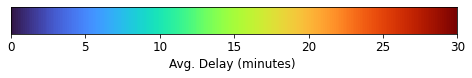

In [0]:
# create color scale bar for legend
from matplotlib.cm import turbo
from matplotlib.colors import to_hex

# We will need to scale the GINI values to lie between 0 and 1
min_gini = 0
max_gini = 30
gini_range = max_gini - min_gini

def calculate_color(gini):
    """
    Convert the GINI coefficient to a color
    """
    # make gini a number between 0 and 1
    normalized_gini = (gini - min_gini) / gini_range

    # invert gini so that high inequality gives dark color
    inverse_gini = 1.0 - normalized_gini

    # transform the gini coefficient to a matplotlib color
    #mpl_color = viridis(inverse_gini)
    mpl_color = turbo(normalized_gini)
    # transform from a matplotlib color to a valid CSS color
    gmaps_color = to_hex(mpl_color, keep_alpha=False)

    return gmaps_color

n=500
fig, ax = plt.subplots(figsize=(8, 0.5))
plt.rcParams['font.size'] = 12
for x in range(n+1):
    ax.axvline(gini_range*x/n+min_gini, color=calculate_color(gini_range*x/n+min_gini), linewidth=4) 
#ax.set_title("hello")
ax.set_xlabel('Avg. Delay (minutes) ')
#ax.xaxis.set_major_formatter('${x:,.0f}')
ax.set_ylim(0,0.5)
ax.set_xlim(0,30)
ax.get_yaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.show()

In [0]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
## Loop thorugh each flight entry
fig = go.Figure()

source_to_dest = zip(delaystate["LATITUDE_ORIGIN"], delaystate["LATITUDE_DESTIN"],
                     delaystate["LONGITUDE_ORIGIN"], delaystate["LONGITUDE_DESTIN"],
                     delaystate[2])
for slat,dlat, slon, dlon, num_flights in source_to_dest:
    fig.add_trace(go.Scattergeo(
                        lat = [slat,dlat],
                        lon = [slon, dlon],
                        mode = 'lines',
                        line = dict(width = 1.5, color=calculate_color(num_flights))
                        ))

## Logic to create labels of source and destination cities of flights
cities = delaystate["ORIG"].values.tolist()+delaystate["DEST"].values.tolist()
scatter_hover_data = [city for city in cities]

## Loop thorugh each flight entry to plot source and destination as points.
fig.add_trace(
    go.Scattergeo(
                lon = df_list_cities["LONGITUDE"],
                lat = df_list_cities["LATITUDE"],
                text = df_list_cities['cities'],
                mode = 'markers+text',
                marker = dict(size = 10, color = 'blue', opacity=0.1))
    )    
fig.update_layout(title = ' Delay states in the US airports 2015-2021',
                  height=700, width=900, geo_scope='usa',
                  #margin={"t":0,"b":0,"l":0, "r":0, "pad":0},
                  #geo = dict(projection_type = 'natural earth',scope = 'north america'),
                  showlegend=False, autosize=True)

fig.show()

In [0]:
# group by day of week
#how many per hour

from pyspark.sql.functions import year, month, dayofmonth, hour, dayofweek
test = test.withColumn('month', month(test.day_stamp))
# group clusters by hours
#citypair_delays = df_airlines.groupBy("CITY_PAIR").sum("DEP_DEL15").toPandas()
#elays in minutes
#citypair_delays_minutes = df_airlines.groupBy("CITY_PAIR").mean("DEP_DELAY").toPandas()
day_cluster_count = test.groupBy("month", "prediction").count().toPandas()
#citypair_delays.set_index('CITY_PAIR', inplace=True)
#citypair_delays_count.set_index('CITY_PAIR', inplace=True)
#citypair_delays_minutes.set_index('CITY_PAIR', inplace=True)
#test_delays_count
#df_citypairdelays = pd.concat([citypair_delays,citypair_delays_count],axis = 1)
#df_citypairdelays = pd.concat([df_citypairdelays,citypair_delays_minutes],axis = 1)
##df_delays.sort_values(by ='% of Total Values', ascending=False )
#df_citypairdelays['percentage']=df_citypairdelays['sum(DEP_DEL15)']/df_citypairdelays['count']*100

#df_delays.index = pd.to_datetime(df_delays.index, errors='coerce')
#df_delays.sort_index(inplace=True)
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)
#df_citypairdelays = df_citypairdelays.reset_index()

day_cluster_count
day_cluster_count['prediction'] = day_cluster_count['prediction'].astype(str)
#hour_cluster_count['hour'] = hour_cluster_count['hour'].astype(str)
#df_citypairdelays.sort_values(by = 'count', ascending = False).head(10)


import plotly.express as px
fig = px.bar(day_cluster_count, x="month", y="count",
             color='prediction', barmode='stack',text="count",color_discrete_sequence=px.colors.qualitative.Set1,
             height=400)
fig.update_xaxes(tick0=0, dtick=1)
fig.update_layout(title = 'Delay State all 2015',
                  height=400, #width=900,
                  showlegend=True, autosize=True)
fig.show()



## Delay network

In [0]:
# !pip install -U airportsdata
# import airportsdata
from pyspark.sql.functions import col,isnan,when,count, lit, concat, col, to_timestamp, monotonically_increasing_id, datediff, mean, sum
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType, NullType, ShortType, DateType, BooleanType, BinaryType
from pyspark.sql import SQLContext
from pyspark.sql.window import Window
 
from math import radians, cos, sin, asin, sqrt
import matplotlib.pyplot as plt
import time
import numpy as np 
import pandas as pd
import seaborn as sns
from pytz import timezone 
from datetime import  datetime, timedelta 
import os
import networkx as nx
from delta.tables import DeltaTable
from copy import deepcopy


def get_hour_minutes(depature_time):
    depature_time = str(depature_time)
    hour = ''
    if depature_time == "2400":
      hour = '00'
      minutes = '00'
    elif len(depature_time) <= 2:
      hour = '00'
      minutes = depature_time
    elif len(depature_time) == 3:
      hour = depature_time[0]
      minutes = depature_time[1:]
    elif len(depature_time) == 4:
      hour = depature_time[:2]
      minutes = depature_time[2:]

    return hour, minutes
  
def get_timestamp(year, month, day, hour_minutes, tz):
  hour, minutes = get_hour_minutes(hour_minutes)
  utc = timezone('UTC')
  tz = timezone(tz)
  timestamp = tz.localize(datetime(int(year), int(month), int(day), hour=int(hour), minute=int(minutes)))
  return timestamp.astimezone(utc)

def get_hour_timestamp(year, month, day, hour_minutes, tz):
  hour, minutes = get_hour_minutes(hour_minutes)
  utc = timezone('UTC')
  tz = timezone(tz)
  timestamp = tz.localize(datetime(int(year), int(month), int(day), hour=int(hour)))
  return timestamp.astimezone(utc)

def get_weather_timestamp(depature_timestamp, hours = 2):
  return (depature_timestamp - timedelta(hours=hours))

def go_back_an_hour(depature_timestamp):
  return (depature_timestamp - timedelta(hours=1))
 
def get_string_timestamp(timestamp):
  return timestamp.strftime("%Y%m%d%H%M")

def get_hourly_string_timestamp(timestamp):
  return timestamp.strftime("%Y%m%d%H")

def get_hour(depature_time):
    depature_time = str(depature_time)
    hour = ''
    if len(depature_time) <= 2:
      hour = '00'
    elif len(depature_time) == 3:
      hour = depature_time[0]
    elif len(depature_time) == 4:
      hour = depature_time[:2]
    return hour

get_hour = udf(get_hour)
get_timestamp = udf(get_timestamp)
get_hour_timestamp = udf(get_hour_timestamp)
get_weather_timestamp = udf(get_weather_timestamp)
get_string_timestamp = udf(get_string_timestamp)
get_hourly_string_timestamp = udf(get_hourly_string_timestamp)
go_back_an_hour = udf(go_back_an_hour)


# get_flight_hour = udf(get_flight_hour)

# Create the timestamp columns for the flight data
df_airlines = df_airlines.withColumn("FLIGHT_TIMESTAMP_ACT", get_timestamp("YEAR", "MONTH", "DAY_OF_MONTH", "DEP_TIME", "tz"))
df_airlines = df_airlines.withColumn("FLIGHT_TIMESTAMP_ACT", get_string_timestamp("FLIGHT_TIMESTAMP_ACT"))
df_airlines = df_airlines.withColumn("FLIGHT_TIMESTAMP_ACT", to_timestamp(col("FLIGHT_TIMESTAMP_ACT"), "yyyyMMddHHmm"))
#df_airlines.cache()

###QRN on joined set

In [0]:
dataset = spark.read.parquet(f"{blob_url}/clean_full_dataset_ori_delay")

In [0]:
# Create the timestamp columns for the flight data
dataset = dataset.withColumn("ORIGIN_FLIGHT_TIMESTAMP_ACT", get_timestamp("YEAR", "MONTH", "DAY_OF_MONTH", "DEP_TIME", "ORIGIN_airport_tz"))
dataset = dataset.withColumn("ORIGIN_FLIGHT_TIMESTAMP_ACT", get_string_timestamp("ORIGIN_FLIGHT_TIMESTAMP_ACT"))
dataset = dataset.withColumn("ORIGIN_FLIGHT_TIMESTAMP_ACT", to_timestamp(col("ORIGIN_FLIGHT_TIMESTAMP_ACT"), "yyyyMMddHHmm"))

In [0]:
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc

dataset = dataset.withColumn('hour_stamp', date_trunc('hour', dataset.ORIGIN_FLIGHT_TIMESTAMP)) 
dataset = dataset.withColumn('hour_stamp_act', date_trunc('hour', dataset.ORIGIN_FLIGHT_TIMESTAMP_ACT)) 

#dataset = dataset.filter((year(dataset.ORIGIN_FLIGHT_TIMESTAMP) == 2018) & (month(dataset.ORIGIN_FLIGHT_TIMESTAMP) == 7))

dataset.cache().count()
display(dataset.select('CRS_DEP_TIME', 'ORIGIN_FLIGHT_TIMESTAMP','hour_stamp',"DEP_TIME" ,"ORIGIN_FLIGHT_TIMESTAMP_ACT",'hour_stamp_act'))

CRS_DEP_TIME,ORIGIN_FLIGHT_TIMESTAMP,hour_stamp,DEP_TIME,ORIGIN_FLIGHT_TIMESTAMP_ACT,hour_stamp_act
530,2015-01-01T12:30:00.000+0000,2015-01-01T12:00:00.000+0000,623,2015-01-01T13:23:00.000+0000,2015-01-01T13:00:00.000+0000
545,2015-01-01T12:45:00.000+0000,2015-01-01T12:00:00.000+0000,658,2015-01-01T13:58:00.000+0000,2015-01-01T13:00:00.000+0000
550,2015-01-01T12:50:00.000+0000,2015-01-01T12:00:00.000+0000,550,2015-01-01T12:50:00.000+0000,2015-01-01T12:00:00.000+0000
600,2015-01-01T13:00:00.000+0000,2015-01-01T13:00:00.000+0000,552,2015-01-01T12:52:00.000+0000,2015-01-01T12:00:00.000+0000
600,2015-01-01T13:00:00.000+0000,2015-01-01T13:00:00.000+0000,549,2015-01-01T12:49:00.000+0000,2015-01-01T12:00:00.000+0000
600,2015-01-01T13:00:00.000+0000,2015-01-01T13:00:00.000+0000,601,2015-01-01T13:01:00.000+0000,2015-01-01T13:00:00.000+0000
615,2015-01-01T13:15:00.000+0000,2015-01-01T13:00:00.000+0000,613,2015-01-01T13:13:00.000+0000,2015-01-01T13:00:00.000+0000
625,2015-01-01T13:25:00.000+0000,2015-01-01T13:00:00.000+0000,625,2015-01-01T13:25:00.000+0000,2015-01-01T13:00:00.000+0000
630,2015-01-01T13:30:00.000+0000,2015-01-01T13:00:00.000+0000,634,2015-01-01T13:34:00.000+0000,2015-01-01T13:00:00.000+0000
645,2015-01-01T13:45:00.000+0000,2015-01-01T13:00:00.000+0000,711,2015-01-01T14:11:00.000+0000,2015-01-01T14:00:00.000+0000


In [0]:
# Crowededness of the airpor at time t
# HERE 2
Ns_df =dataset.groupBy("hour_stamp").count()
N_df = dataset.groupBy("hour_stamp_act").count()
Ns_df = Ns_df.withColumnRenamed("count",'Ns')
N_df = N_df.withColumnRenamed("count",'N')
N_df = N_df.withColumnRenamed("hour_stamp_act",'hour_stamp')
N_df.cache().count()
Ns_df.cache().count()

display(Ns_df)


hour_stamp,Ns
2015-01-14T15:00:00.000+0000,979
2015-01-21T22:00:00.000+0000,1017
2015-02-26T13:00:00.000+0000,795
2015-03-30T13:00:00.000+0000,1001
2015-04-09T03:00:00.000+0000,258
2015-04-11T13:00:00.000+0000,864
2015-04-14T20:00:00.000+0000,975
2015-04-14T21:00:00.000+0000,1050
2015-04-26T00:00:00.000+0000,615
2015-04-30T07:00:00.000+0000,59


In [0]:
min_date, max_date = dataset.select(min("hour_stamp"), max("hour_stamp")).first()
min_date, max_date

Out[105]: (datetime.datetime(2015, 1, 1, 10, 0), datetime.datetime(2022, 1, 1, 9, 0))

In [0]:
#generate a time series
from pyspark.sql.functions import col
from pyspark.sql import SparkSession

def generate_series(start, stop, interval):
    """
    :param start  - lower bound, inclusive
    :param stop   - upper bound, exclusive
    :interval int - increment interval in seconds
    """
    spark = SparkSession.builder.getOrCreate()
    # Determine start and stops in epoch seconds
    start, stop = spark.createDataFrame(
        [(start, stop)], ("start", "stop")
    ).select(
        [col(c).cast("timestamp").cast("long") for c in ("start", "stop")
    ]).first()
    # Create range with increments and cast to timestamp
    return spark.range(start, stop, interval).select(
        col("id").cast("timestamp").alias("hour_stamp")
    )

df_time = generate_series("2015-01-01T10:00:00.000+0000", "2022-01-01T10:00:00.000+0000", 60 * 60)  # By hour
#df_time = df_time.join(Ns_df, "hour_stamp",'left')
df_time = df_time.join(N_df, "hour_stamp",'left')
df_time.cache().count()

display(df_time)

hour_stamp,N
2015-01-01T10:00:00.000+0000,83
2015-01-01T11:00:00.000+0000,277
2015-01-01T12:00:00.000+0000,412
2015-01-01T13:00:00.000+0000,585
2015-01-01T14:00:00.000+0000,722
2015-01-01T15:00:00.000+0000,710
2015-01-01T16:00:00.000+0000,789
2015-01-01T17:00:00.000+0000,901
2015-01-01T18:00:00.000+0000,853
2015-01-01T19:00:00.000+0000,922


In [0]:
# do the time intervals here
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc, expr
from pyspark.sql.window import Window
47
hours = lambda i: i * 3600

#windowSpec = Window.orderBy(col("hour_stamp").cast('long')).rangeBetween(-hours(13), -hours(2))

for i in range(3,15):
  print('N'+ str(i-2) +'h_sum')

  
# redo with hour_stamp for schedule flights
  windowSpec_act = Window.orderBy(col("hour_stamp").cast('long')).rangeBetween(-hours(i), -hours(3))
  df_time = df_time.withColumn('N'+ str(i-2) +'h_sum', sum("N").over(windowSpec_act)) 

df_time.cache().count()

N1h_sum
N2h_sum
N3h_sum
N4h_sum
N5h_sum
N6h_sum
N7h_sum
N8h_sum
N9h_sum
N10h_sum
N11h_sum
N12h_sum
Out[107]: 61368

In [0]:
# scheduled and actual operations of the airpor at time t
Qs_df =dataset.groupBy("hour_stamp", "ORIGIN").count()
Q_df = dataset.groupBy("hour_stamp_act", "ORIGIN").count()
Qs_df = Qs_df.withColumnRenamed("count",'Qs')
Q_df = Q_df.withColumnRenamed("count",'Q')
Q_df = Q_df.withColumnRenamed("hour_stamp_act",'hour_stamp')
#display(w2.filter((col("hour_stamp")=='2018-07-08T15:00:00.000+0000')|(col("hour_stamp")=='2018-07-08T16:00:00.000+0000')|\
#       (col("hour_stamp")=='2018-07-08T17:00:00.000+0000')) )
Q_df.cache().count()
Qs_df.cache().count()
display(Q_df)

hour_stamp,ORIGIN,Q
2018-08-11T18:00:00.000+0000,ATL,50
2018-08-12T12:00:00.000+0000,ATL,81
2018-08-21T18:00:00.000+0000,ATL,54
2018-08-26T12:00:00.000+0000,ATL,63
2018-08-30T11:00:00.000+0000,ATL,34
2018-09-11T00:00:00.000+0000,ATL,56
2018-09-12T09:00:00.000+0000,ATL,8
2018-09-13T15:00:00.000+0000,ATL,49
2018-09-15T11:00:00.000+0000,ATL,12
2018-09-21T23:00:00.000+0000,ATL,77


In [0]:
list_cities = Qs_df.select("ORIGIN").distinct().rdd.flatMap(lambda x: x).collect()

In [0]:
#generate a time series for each city!!

from pyspark.sql.functions import col
from pyspark.sql import SparkSession

i =0
for city in list_cities:
  df_time2 = generate_series("2015-01-01T10:00:00.000+0000", "2022-01-01T10:00:00.000+0000", 60 * 60)  # By hour
  df_time2 = df_time2.withColumn("ORIGIN", lit(city))
  
  if i ==0:
    result = df_time2
  else:
    result = result.union(df_time2)
    
  i = i +1
  
result.cache().count()  
display(result)


hour_stamp,ORIGIN
2015-01-01T10:00:00.000+0000,BGM
2015-01-01T11:00:00.000+0000,BGM
2015-01-01T12:00:00.000+0000,BGM
2015-01-01T13:00:00.000+0000,BGM
2015-01-01T14:00:00.000+0000,BGM
2015-01-01T15:00:00.000+0000,BGM
2015-01-01T16:00:00.000+0000,BGM
2015-01-01T17:00:00.000+0000,BGM
2015-01-01T18:00:00.000+0000,BGM
2015-01-01T19:00:00.000+0000,BGM


In [0]:
result = result.join(Q_df, ["hour_stamp",'ORIGIN'],'left')
result = result.join(Qs_df, ["hour_stamp",'ORIGIN'],'left')

result = result.na.fill(value=0)
result.cache().count()
display(result)

hour_stamp,ORIGIN,Q,Qs
2015-01-01T10:00:00.000+0000,BTR,0,0
2015-01-01T10:00:00.000+0000,VCT,0,0
2015-01-01T11:00:00.000+0000,ATL,6,4
2015-01-01T11:00:00.000+0000,BQK,0,0
2015-01-01T11:00:00.000+0000,LIH,0,0
2015-01-01T12:00:00.000+0000,WRG,0,0
2015-01-01T13:00:00.000+0000,ABI,0,0
2015-01-01T13:00:00.000+0000,SHD,0,0
2015-01-01T14:00:00.000+0000,FLL,15,14
2015-01-01T14:00:00.000+0000,SHV,0,0


In [0]:
dataset# do the time intervals here
from pyspark.sql.functions import col,isnan,when,count,lit,split, max, min, year, month, date_trunc, expr
from pyspark.sql.window import Window

hours = lambda i: i * 3600

#windowSpec = Window.orderBy(col("hour_stamp").cast('long')).rangeBetween(-hours(13), -hours(2))

for i in range(3,15):
  print('N'+ str(i-2) +'h_sum')
 
  windowSpec_act = Window.partitionBy('ORIGIN').orderBy(col("hour_stamp").cast('long')).rangeBetween(-hours(i), -hours(3))
  result = result.withColumn('Q'+ str(i-2) +'h_sum', sum("Q").over(windowSpec_act))

  windowSpec = Window.partitionBy('ORIGIN').orderBy(col("hour_stamp").cast('long')).rangeBetween(-hours(i), -hours(3))
  result = result.withColumn('Qs'+ str(i-2) +'h_sum', sum("Qs").over(windowSpec))
  
  result = result.withColumn('R'+ str(i-2) +'h', col('Q'+ str(i-2) +'h_sum')/col('Qs'+ str(i-2) +'h_sum'))
  
test_joined = dataset.join(result, ["hour_stamp",'ORIGIN'],'left')
test_joined = test_joined.join(df_time, "hour_stamp",'left')
test_joined.cache().count()
display(test_joined)


N1h_sum
N2h_sum
N3h_sum
N4h_sum
N5h_sum
N6h_sum
N7h_sum
N8h_sum
N9h_sum
N10h_sum
N11h_sum
N12h_sum


hour_stamp,ORIGIN,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_STATE_ABR,DEST_AIRPORT_ID,DEST,DEST_STATE_ABR,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,YEAR,ORIGIN_icao,ORIGIN_iata,ORIGIN_airport_name,ORIGIN_airport_city,ORIGIN_airport_subd,ORIGIN_airport_country,ORIGIN_elevation,ORIGIN_airport_lat,ORIGIN_airport_lon,ORIGIN_airport_tz,flight_id,ORIGIN_FLIGHT_TIMESTAMP,HOUR_WEATHER_TIMESTAMP,WEATHER_TIMESTAMP,TWO_HOUR_WEATHER_TIMESTAMP,THREE_HOUR_WEATHER_TIMESTAMP,ORIGIN_STATION_ID,ORIGIN_STATION_NAME,ORIGIN_STATION_ELEVATION,ORIGIN_STATION_LATITUDE,ORIGIN_STATION_LONGITUDE,ORIGIN_WEATHER_DATE,ORIGIN_WEATHER_REPORT_TYPE,ORIGIN_WEATHER_SOURCE,ORIGIN_HourlyPrecipitation,ORIGIN_HourlyPresentWeatherType,ORIGIN_STATION_TIMESTAMP,HOUR_TIMESTAMP,ORIGIN_HourlyDewPointTemperature,ORIGIN_HourlyDryBulbTemperature,ORIGIN_HourlyWetBulbTemperature,ORIGIN_HourlyStationPressure,ORIGIN_HourlyWindDirection,ORIGIN_HourlyWindSpeed,ORIGIN_HourlyVisibility,ORIGIN_AU_code,ORIGIN_AW_code,ORIGIN_MW_code,ORIGIN_AU_TS,ORIGIN_AU_ICE,ORIGIN_AU_SNOW,ORIGIN_AU_FOG,ORIGIN_AW_TS,ORIGIN_AW_ICE,ORIGIN_AW_SNOW,ORIGIN_AW_FOG,ORIGIN_MW_TS,ORIGIN_MW_ICE,ORIGIN_MW_SNOW,ORIGIN_MW_FOG,ORIGIN_TS,ORIGIN_ICE,ORIGIN_SNOW,ORIGIN_FOG,DEST_icao,DEST_iata,DEST_airport_name,DEST_airport_city,DEST_airport_subd,DEST_airport_country,DEST_elevation,DEST_airport_lat,DEST_airport_lon,DEST_airport_tz,DEST_STATION_ID,DEST_STATION_NAME,DEST_STATION_ELEVATION,DEST_STATION_LATITUDE,DEST_STATION_LONGITUDE,DEST_WEATHER_DATE,DEST_WEATHER_REPORT_TYPE,DEST_WEATHER_SOURCE,DEST_HourlyPrecipitation,DEST_HourlyPresentWeatherType,DEST_STATION_TIMESTAMP,DEST_HourlyDewPointTemperature,DEST_HourlyDryBulbTemperature,DEST_HourlyWetBulbTemperature,DEST_HourlyStationPressure,DEST_HourlyWindDirection,DEST_HourlyWindSpeed,DEST_HourlyVisibility,DEST_AU_code,DEST_AW_code,DEST_MW_code,DEST_AU_TS,DEST_AU_ICE,DEST_AU_SNOW,DEST_AU_FOG,DEST_AW_TS,DEST_AW_ICE,DEST_AW_SNOW,DEST_AW_FOG,DEST_MW_TS,DEST_MW_ICE,DEST_MW_SNOW,DEST_MW_FOG,DEST_TS,DEST_ICE,DEST_SNOW,DEST_FOG,ARRIVAL_FLIGHT_TIMESTAMP,PREV_DEP_DELAY,PREV_DEPARTURE_TIMESTAMP,PREV_ARR_DELAY,PREV_ARRIVAL_TIMESTAMP,time_between_flights,PREV_DEP_15,AVG_DELAY_ORIGIN_LAST_12,PER_DELAY_15_ORIGIN_LAST_12,AVG_DELAY_ORIGIN_LAST_6,PER_DELAY_15_ORIGIN_LAST_6,AVG_DELAY_ORIGIN_LAST_3,PER_DELAY_15_ORIGIN_LAST_3,AVG_DELAY_ORIGIN_LAST_1,PER_DELAY_15_ORIGIN_LAST_1,ORIGIN_FLIGHT_TIMESTAMP_ACT,hour_stamp_act,Q,Qs,Q1h_sum,Qs1h_sum,R1h,Q2h_sum,Qs2h_sum,R2h,Q3h_sum,Qs3h_sum,R3h,Q4h_sum,Qs4h_sum,R4h,Q5h_sum,Qs5h_sum,R5h,Q6h_sum,Qs6h_sum,R6h,Q7h_sum,Qs7h_sum,R7h,Q8h_sum,Qs8h_sum,R8h,Q9h_sum,Qs9h_sum,R9h,Q10h_sum,Qs10h_sum,R10h,Q11h_sum,Qs11h_sum,R11h,Q12h_sum,Qs12h_sum,R12h,N,N1h_sum,N2h_sum,N3h_sum,N4h_sum,N5h_sum,N6h_sum,N7h_sum,N8h_sum,N9h_sum,N10h_sum,N11h_sum,N12h_sum
2015-01-01T11:00:00.000+0000,ATL,1,1,1,4,2015-01-01,F9,20436,N949FR,10397,GA,15356,TTN,NJ,600,619,19.0,19.0,1.0,1,0600-0659,750,814,24.0,24.0,1.0,1,0700-0759,0.0,0.0,701.0,3,19.0,0.0,5.0,0.0,0.0,2015,KATL,ATL,Hartsfield Jackson Atlanta International Airport,Atlanta,Georgia,US,1026.0,33.6366996765,-84.4281005859,America/New_York,77310167459,2015-01-01T11:00:00.000+0000,2015010109,2015-01-01T09:00:00.000+0000,2015010108,2015010107,72219013874,"ATLANTA HARTSFIELD JACKSON INTERNATIONAL AIRPORT, GA US",307.8,33.6301,-84.4418,2015-01-01T03:52:00,FM-15,7,0.0,null,2015-01-01T08:52:00.000+0000,2015010108,26.0,35.0,32.0,29.21,0.0,0.0,10.0,null,null,null,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,KTTN,TTN,Trenton Mercer Airport,Trenton,New Jersey,US,213.0,40.2766990662,-74.8134994507,America/New_York,72409514792,"TRENTON MERCER AIRPORT, NJ US",57.9,40.27679,-74.81594,2015-01-01T03:53:00,FM-15,7,0.0,null,2015-01-01T08:53:00.0

In [0]:
#display(test_joined.filter(col('ORIGIN')=='ATL').selesct())
display(test_joined.filter((col('ORIGIN')=="ATL") & (year(test_joined.ORIGIN_FLIGHT_TIMESTAMP) == 2018) & (month(test_joined.ORIGIN_FLIGHT_TIMESTAMP) == 7)).select('ORIGIN_FLIGHT_TIMESTAMP','hour_stamp',"ORIGIN_FLIGHT_TIMESTAMP_ACT",'hour_stamp_act', 'Q', 'Qs', 'Q1h_sum','Qs1h_sum',  'R1h' ))


ORIGIN_FLIGHT_TIMESTAMP,hour_stamp,ORIGIN_FLIGHT_TIMESTAMP_ACT,hour_stamp_act,Q,Qs,Q1h_sum,Qs1h_sum,R1h
2018-07-01T09:30:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:30:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:30:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:33:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:34:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:30:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:41:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:39:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:45:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:45:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:45:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:44:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:50:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:48:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:50:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:50:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T09:55:00.000+0000,2018-07-01T09:00:00.000+0000,2018-07-01T09:47:00.000+0000,2018-07-01T09:00:00.000+0000,11,9,0,0,null
2018-07-01T19:00:00.000+0000,2018-07-01T19:00:00.000+0000,2018-07-01T18:58:00.000+0000,2018-07-01T18:00:00.000+0000,66,68,60,61,0.9836065573770492


In [0]:
display(result.filter((col('ORIGIN')=="ATL") & (year(result.hour_stamp) == 2018) & (month(result.hour_stamp) == 7)).orderBy('hour_stamp'))

hour_stamp,ORIGIN,Q,Qs,Q1h_sum,Qs1h_sum,R1h,Q2h_sum,Qs2h_sum,R2h,Q3h_sum,Qs3h_sum,R3h,Q4h_sum,Qs4h_sum,R4h,Q5h_sum,Qs5h_sum,R5h,Q6h_sum,Qs6h_sum,R6h,Q7h_sum,Qs7h_sum,R7h,Q8h_sum,Qs8h_sum,R8h,Q9h_sum,Qs9h_sum,R9h,Q10h_sum,Qs10h_sum,R10h,Q11h_sum,Qs11h_sum,R11h,Q12h_sum,Qs12h_sum,R12h
2018-07-01T00:00:00.000+0000,ATL,56,40,64,64,1.0,126,129,0.9767441860465116,201,196,1.0255102040816326,243,248,0.9798387096774194,298,304,0.9802631578947368,362,371,0.9757412398921833,415,426,0.9741784037558685,488,498,0.9799196787148594,564,582,0.9690721649484536,651,659,0.9878603945371776,672,684,0.9824561403508771,686,698,0.9828080229226361
2018-07-01T01:00:00.000+0000,ATL,56,60,45,38,1.1842105263157894,109,102,1.0686274509803921,171,167,1.0239520958083832,246,234,1.0512820512820513,288,286,1.006993006993007,343,342,1.0029239766081872,407,409,0.9951100244498777,460,464,0.9913793103448276,533,536,0.9944029850746269,609,620,0.9822580645161291,696,697,0.9985652797704447,717,722,0.9930747922437673
2018-07-01T02:00:00.000+0000,ATL,63,63,65,81,0.8024691358024691,110,119,0.9243697478991597,174,183,0.9508196721311475,236,248,0.9516129032258065,311,315,0.9873015873015873,353,367,0.9618528610354223,408,423,0.9645390070921985,472,490,0.963265306122449,525,545,0.963302752293578,598,617,0.9692058346839546,674,701,0.9614835948644793,761,778,0.9781491002570694
2018-07-01T03:00:00.000+0000,ATL,5,0,56,40,1.4,121,121,1.0,166,159,1.0440251572327044,230,223,1.031390134529148,292,288,1.0138888888888888,367,355,1.0338028169014084,409,407,1.0049140049140048,464,463,1.0021598272138228,528,530,0.9962264150943396,581,585,0.9931623931623932,654,657,0.9954337899543378,730,741,0.9851551956815114
2018-07-01T04:00:00.000+0000,ATL,0,0,56,60,0.9333333333333333,112,100,1.12,177,181,0.9779005524861878,222,219,1.0136986301369864,286,283,1.010600706713781,348,348,1.0,423,415,1.0192771084337349,465,467,0.9957173447537473,520,523,0.994263862332696,584,590,0.9898305084745763,637,645,0.9875968992248062,710,717,0.9902370990237099
2018-07-01T05:00:00.000+0000,ATL,0,0,63,63,1.0,119,123,0.967479674796748,175,163,1.0736196319018405,240,244,0.9836065573770492,285,282,1.0106382978723405,349,346,1.0086705202312138,411,411,1.0,486,478,1.0167364016736402,528,530,0.9962264150943396,583,586,0.9948805460750854,647,653,0.9908116385911179,700,708,0.9887005649717514
2018-07-01T06:00:00.000+0000,ATL,0,0,5,0,null,68,63,1.0793650793650793,124,123,1.008130081300813,180,163,1.1042944785276074,245,244,1.0040983606557377,290,282,1.0283687943262412,354,346,1.023121387283237,416,411,1.0121654501216546,491,478,1.0271966527196652,533,530,1.0056603773584907,588,586,1.0034129692832765,652,653,0.998468606431853
2018-07-01T07:00:00.000+0000,ATL,0,0,0,0,null,5,0,null,68,63,1.0793650793650793,124,123,1.008130081300813,180,163,1.1042944785276074,245,244,1.0040983606557377,290,282,1.0283687943262412,354,346,1.023121387283237,416,411,1.0121654501216546,491,478,1.0271966527196652,533,530,1.0056603773584907,588,586,1.0034129692832765
2018-07-01T08:00:00.000+0000,ATL,0,0,0,0,null,0,0,null,5,0,null,68,63,1.0793650793650793,124,123,1.008130081300813,180,163,1.1042944785276074,245,244,1.0040983606557377,290,282,1.0283687943262412,354,346,1.023121387283237,416,411,1.0121654501216546,491,478,1.0271966527196652,533,530,1.0056603773584907
2018-07-01T09:00:00.000+0000,ATL,11,9,0,0,null,0,0,null,0,0,null,5,0,null,68,63,1.0793650793650793,124,123,1.008130081300813,180,163,1.1042944785276074,245,244,1.0040983606557377,290,282,1.0283687943262412,354,346,1.023121387283237,416,411,1.0121654501216546,491,478,1.0271966527196652


In [0]:
#write to blob
#dataset.columns
test_joined.write.mode("overwrite").parquet(f"{blob_url}/QRN_fullset_V3")

In [0]:
display(Q_df.filter((col('ORIGIN')=="ATL") & (year(Q_df.hour_stamp) == 2018) & (month(Q_df.hour_stamp) == 7)).orderBy('hour_stamp'))

hour_stamp,ORIGIN,Q
2018-07-01T00:00:00.000+0000,ATL,56
2018-07-01T01:00:00.000+0000,ATL,56
2018-07-01T02:00:00.000+0000,ATL,63
2018-07-01T03:00:00.000+0000,ATL,5
2018-07-01T09:00:00.000+0000,ATL,11
2018-07-01T10:00:00.000+0000,ATL,14
2018-07-01T11:00:00.000+0000,ATL,29
2018-07-01T12:00:00.000+0000,ATL,79
2018-07-01T13:00:00.000+0000,ATL,85
2018-07-01T14:00:00.000+0000,ATL,73


In [0]:
Qs_df_debug =df_pivoted_train.groupBy("hour_stamp", "ORIGIN").count()
Q_df_debug = df_pivoted_train.groupBy("hour_stamp_act", "ORIGIN").count()

In [0]:
display(Q_df_debug.filter((col('ORIGIN')=="ATL")))

hour_stamp_act,ORIGIN,count
2018-07-28T01:00:00.000+0000,ATL,86
2018-07-19T22:00:00.000+0000,ATL,49
2018-07-06T15:00:00.000+0000,ATL,52
2018-07-17T09:00:00.000+0000,ATL,14
2018-07-01T01:00:00.000+0000,ATL,54
2018-07-26T14:00:00.000+0000,ATL,85
2018-07-26T01:00:00.000+0000,ATL,85
2018-07-16T03:00:00.000+0000,ATL,37
2018-07-02T19:00:00.000+0000,ATL,69
2018-07-01T21:00:00.000+0000,ATL,58


In [0]:
df_airlines.columns

Out[134]: ['QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'TAIL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN',
 'ORIGIN_STATE_ABR',
 'DEST_AIRPORT_ID',
 'DEST',
 'DEST_STATE_ABR',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'DIVERTED',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'YEAR',
 'ident',
 'type',
 'name',
 'elevation_ft',
 'continent',
 'iso_country',
 'iso_region',
 'municipality',
 'gps_code',
 'iata_code',
 'local_code',
 'coordinates',
 'tz',
 'FLIGHT_TIMESTAMP',
 'calc_dep_delay',
 'calc_arr_delay',
 'CITY_PAIR',
 'FLIGHT_TIMESTAMP_ACT']